# Fundamentals of Computer Vision: Applied Projects


This Jupyter notebook contains the bases of the projects you need to develop during the semester.

The main goal of this project is twofold: 1st is to reiterate the theoretical context of the lectures and 2nd to use those methods in adapted examples for real-world scenarios.

## Import libraries, util functions and test image loading



In [21]:
%pip install imutils
%pip install opencv-python
%pip install pytesseract
%pip install opencv-python pytesseract pillow

import cv2
import pytesseract
import urllib3
import numpy as np

from PIL import Image

import imutils
from matplotlib import pyplot as plt

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [22]:
def visualize(images,titles,suptitles,n):
    fig, axes = plt.subplots(1, len(images), figsize=(10, 5))
    for i in range(len(images)):
        axes[i].imshow(images[i], cmap='gray')
        axes[i].set_title(titles[i])
        axes[i].axis("off")
    if suptitles != None:
        plt.suptitle(suptitles[n])
    plt.tight_layout()
    plt.show()

In [23]:
def visualize_2(outputs, titles, suptitles, n):
    fig, axes = plt.subplots(len(outputs), len(outputs[0]), figsize=(10, 5))
    for i in range(len(outputs)):
      for j in range(len(outputs[0])):
        axes[i,j].imshow(outputs[i][j], cmap='gray')
        axes[i,j].set_title(titles[j])
        axes[i,j].axis("off")
    if suptitles!=None:
        plt.suptitle(suptitles[n])
    plt.tight_layout()
    plt.show()

# Block 2. Non-Linear Filtering and Morphological operations.

While linear filters can be effective for certain tasks, they often come with limitations when dealing with specific types of noise or when aiming to achieve certain effects on the image.

### Objectives:

1. **Median Filter Implementation**:
 Implement the median filter and understand its significance in noise removal.

2. **Defect detection with morphological operations**:
 Implement the basic morphological operations of dilation and erosion. Then implement the derived operations from these basics. After all this, propose pipelines to detect precisely the defects on some images.

3. **Watermarking**:
 Propose a pipeline for image watermarking using any of the previous techniques (Linear filtering, Non-linear filtering, Fourier transform, Morphological operations).

4. **Watermark extraction challenge (extra points)**
 Given three images with embedded watermarks of varying complexity levels, employ a combination of techniques seen in the course (image enhancing, linear filtering, non-linear filtering, morphological operations, and Fourier analysis) to extract the watermarks.
 You should obtain the binary mask with legible watermark for each image.

 ***Note***: The Challenge Exercise can augment your grade on the base grade. For example, if you score 6 on this lab and complete the challenge, your score may be boosted up to 2 points, depending on the solution (0.5 easy; 0.5 medium; 1 hard). The total lab grade remains capped at 10 points.

---

### Mandatory Questions:

- How does the median filter differ in functionality from the mean filter, and under what circumstances is it preferable to use it?
- Describe how a median filter works in the spatial domain.
- How does the window size of the median filter affect the output image?
- Can a median filter be implemented as a convolution operation? Explain why or why not.
- What are the basic morphological operations? Describe dilation and erosion in terms of structuring elements.
- How do morphological operations change the shape and size of objects in an image?
- What are some common derived morphological operations and where they are used for?
- What is the purpose of watermarking in image processing?
- What is the difference between visible and invisible watermarks?
- How could you utilize Fourier Transform for watermark embedding?


### Optional Deep Dive Questions:

- Beyond noise removal, can you think of any other applications where the median filter might be advantageous?
- Compare the computational complexity of median filtering with Gaussian filtering.
- Describe the process of top-hat and bottom-hat filtering. How can they be used for defect detection?
- Can morphological operations be applied to multi-channel images? Discuss the challenges.
- Discuss the concept of "hit-or-miss" transform in morphological operations. How can it be useful in defect detection?
- Explore the concept of morphological gradients. How can they be derived from the basic operations of erosion and dilation?
- In watermark extraction, are there any other techniques or methods (beyond the scope of this course) that might aid in making the extraction process more efficient or accurate? Research and discuss.
- Explore more robust watermarking and the techniques.

## Median filter

#### Objective:
Implement the median filter operation by hand and compare with linear blur filters.

---

#### Guideline:
1. Implement a function to perform the median filters over an image. Make sure to handle edge cases and allow for different kernel sizes. DO NOT USE LIBRARY IMPLEMENTATIONS.
2. Experiment with different kernel sizes and apply on various images.
3. Add different quantities of noise and analyze when an image is not recoverable.
4. Compare your hand-implemented method with libraries implementation.
5. Finally compare the median filter to the linear filter counterparts (gaussian / box filters) in order to explain how they differ.
---

#### Expected results:
- Your hand-implemented median filter.
- Qualitative comparison on different blurs

#### *1. Median blur to greyscale images and noisy images*

In [77]:
def median_blur(image, kernel_size):
  height, width = image.shape
  output_image = np.zeros_like(image)

  half_kernel = kernel_size // 2

  for i in range(half_kernel, height - half_kernel):
    for j in range(half_kernel, width - half_kernel):
      #Extract neighborhood
      neighborhood = image[i - half_kernel:i + half_kernel + 1, j - half_kernel:j + half_kernel + 1]
      #Apply median filter
      output_image[i,j] = np.median(neighborhood)
  
  return output_image

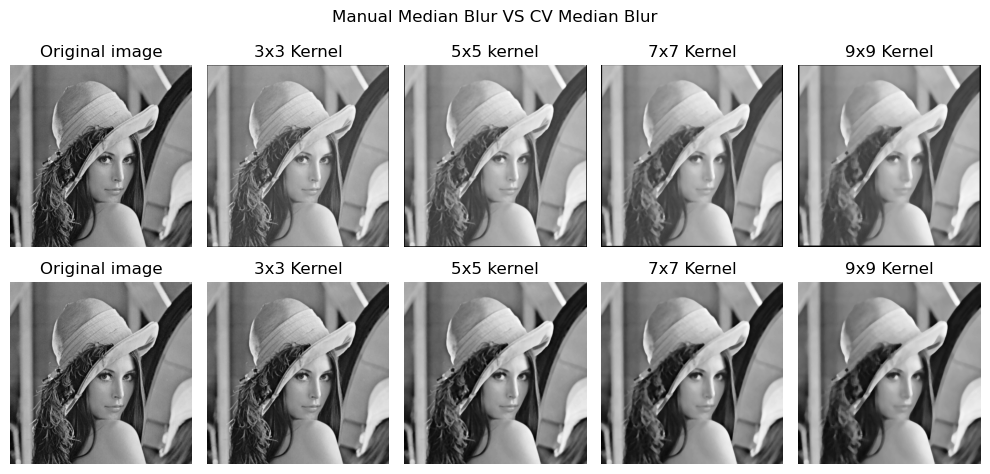

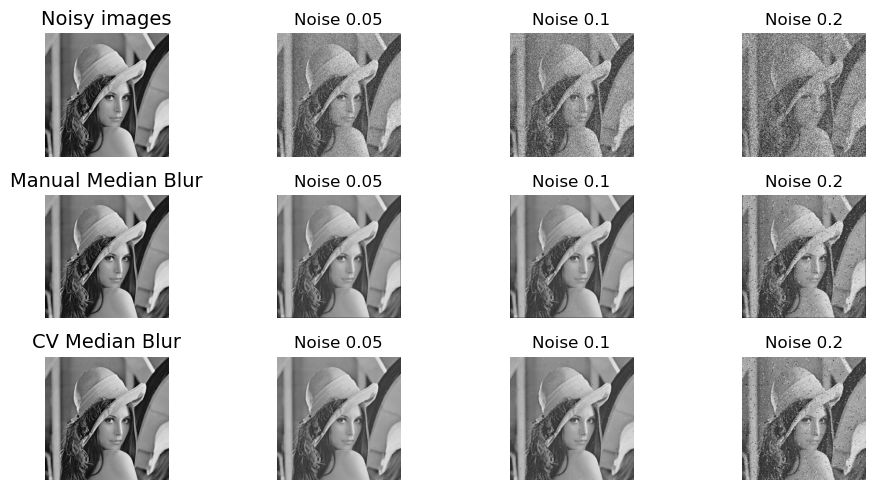

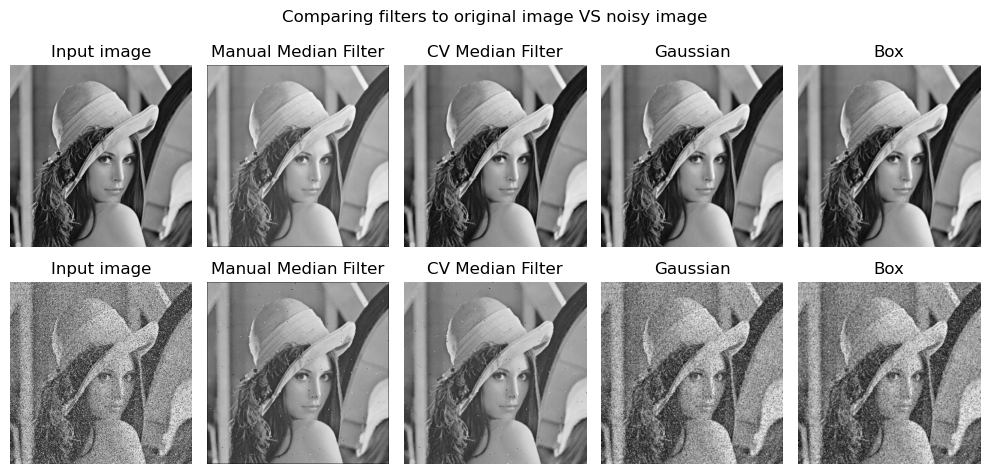

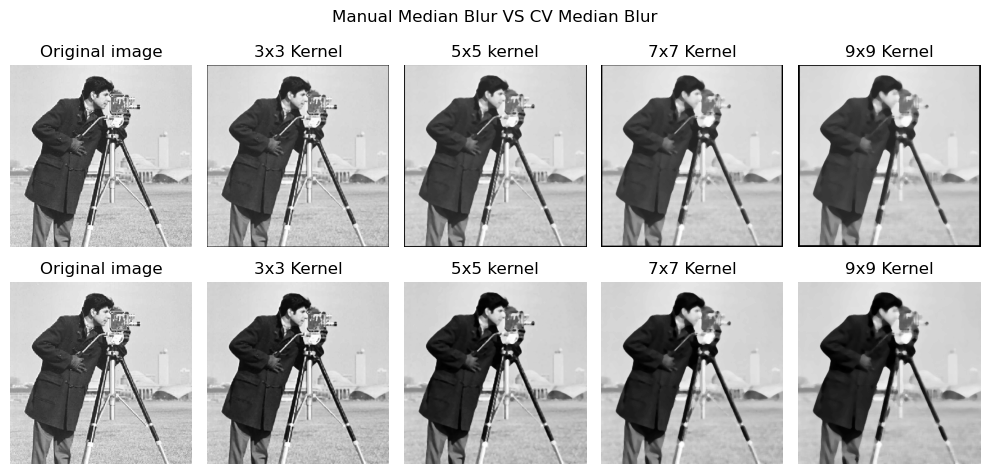

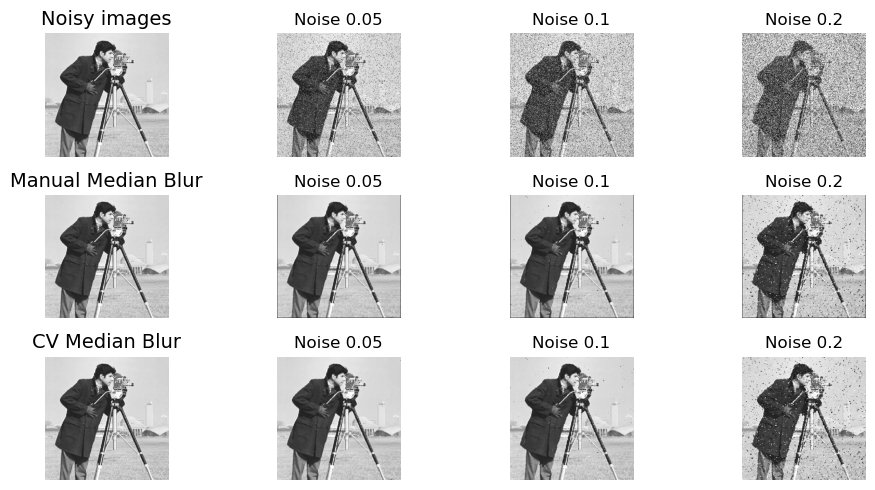

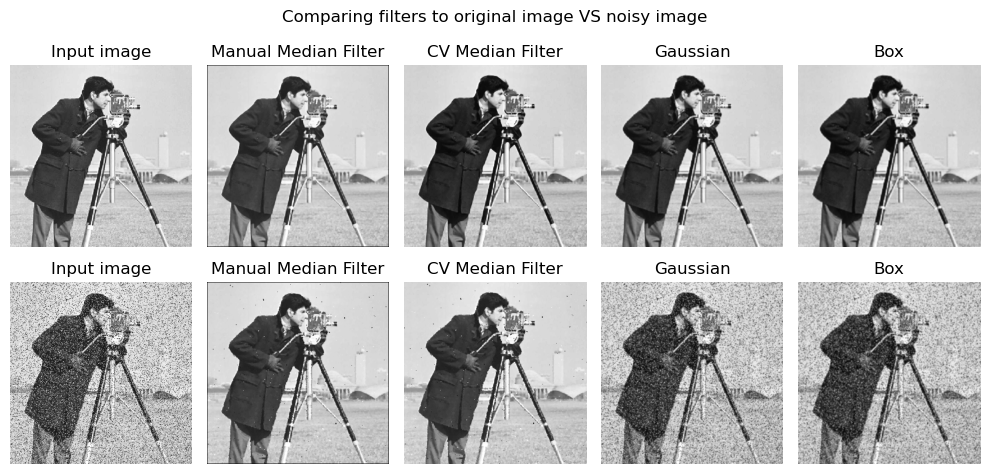

In [78]:
#MAIN
images = ["lenna.png","cameraman.png"]
kernel_sizes = [3,5,7,9]
noises = [0.05,0.1,0.2] #noise probabilities

for image in images:
  image = cv2.imread(f"images/{image}",cv2.IMREAD_GRAYSCALE)
  if image is None:
    print("Image not found")
  else:
    # APPLY MEDIAN_BLUR TO IMAGE WITH DIFFERENT KERNEL SIZES
    outputs_1 = [image] #manual median filter 
    outputs_2 = [image] #function median filter
    for i in range(len(kernel_sizes)):
      output = median_blur(image,kernel_sizes[i])
      outputs_1.append(output)
      output = cv2.medianBlur(image, kernel_sizes[i])
      outputs_2.append(output)
    # PRINT IMAGES
    output_titles = ["Original image","3x3 Kernel","5x5 kernel","7x7 Kernel","9x9 Kernel"]
    outputs = [outputs_1, outputs_2]
    visualize_2(outputs,output_titles,["Manual Median Blur VS CV Median Blur"],0)

    # ADD NOISE + Analyze when image is not recoverable
    noisy_images = [image]
    outputs_1 = [image] #Manual median filter outputs
    outputs_2 = [image] #CV funtion median filter outputs
    for i in range(len(noises)):
      #Create noisy image
      noisy_image = image.copy()
      random = np.random.random(image.shape)
      noisy_image[random < noises[i]] = 0
      noisy_image[random > 1 -  noises[i]] = 255
      noisy_images.append(noisy_image)
      #Apply median filter
      output = median_blur(noisy_image,3)
      output_function = cv2.medianBlur(noisy_image, 3)
      #Append outputs to list
      outputs_1.append(output)
      outputs_2.append(output_function)
    # PRINT IMAGES
    outputs = [noisy_images, outputs_1, outputs_2]
    output_titles = ["Original image","Noise 0.05","Noise 0.1","Noise 0.2"]
    row_titles = ["Noisy images","Manual Median Blur","CV Median Blur"]
    fig, axes = plt.subplots(len(outputs), len(outputs_1), figsize=(10, 5))
    for i in range(len(outputs)):
      for j in range(len(outputs_1)):
        axes[i,j].imshow(outputs[i][j], cmap='gray')
        axes[i,j].set_title(output_titles[j])
        axes[i,j].axis("off")
      axes[i, 0].set_title(row_titles[i], fontsize=14)
    plt.tight_layout()
    plt.show()

    #COMPARE MEDIAN FILTER WITH GAUSSIAN AND BOX FILTERS
    #1. Apply to normal image 
    output_manual = median_blur(image,3)
    output_cvfunction = cv2.medianBlur(image, 3)
    output_gaussian = cv2.GaussianBlur(image, (3, 3), 0)
    output_box = cv2.boxFilter(image, -1, (3, 3))
    outputs_1 = [image,output_manual,output_cvfunction,output_gaussian,output_box]
    #2. Apply to noisy image
    noisy_image = noisy_images[2] #Select image of noise prob 0.1
    output_manual_2 = median_blur(noisy_image,3)
    output_cvfunction_2 = cv2.medianBlur(noisy_image, 3)
    output_gaussian_2 = cv2.GaussianBlur(noisy_image, (3, 3), 0)
    output_box_2 = cv2.boxFilter(noisy_image, -1, (3, 3))
    outputs_2 = [noisy_image,output_manual_2,output_cvfunction_2,output_gaussian_2,output_box_2]
    # PRINT IMAGES
    output_titles = ["Input image","Manual Median Filter","CV Median Filter","Gaussian","Box"]
    outputs = [outputs_1, outputs_2]
    visualize_2(outputs, output_titles,["Comparing filters to original image VS noisy image"],0)

    


#### *2. Median blur to color images and noisy images*

In [79]:
def median_blur_color(image, kernel_size):
    height, width, channels = image.shape
    output_image = np.zeros_like(image)

    half_kernel = kernel_size // 2

    for i in range(half_kernel, height - half_kernel):
        for j in range(half_kernel, width - half_kernel):
            # Extract neighborhood for each color channel
            neighborhood = image[i - half_kernel:i + half_kernel + 1, j - half_kernel:j + half_kernel + 1, :]
            # Apply median filter to each color channel separately
            for c in range(channels):
                output_image[i, j, c] = np.median(neighborhood[:, :, c])

    return output_image

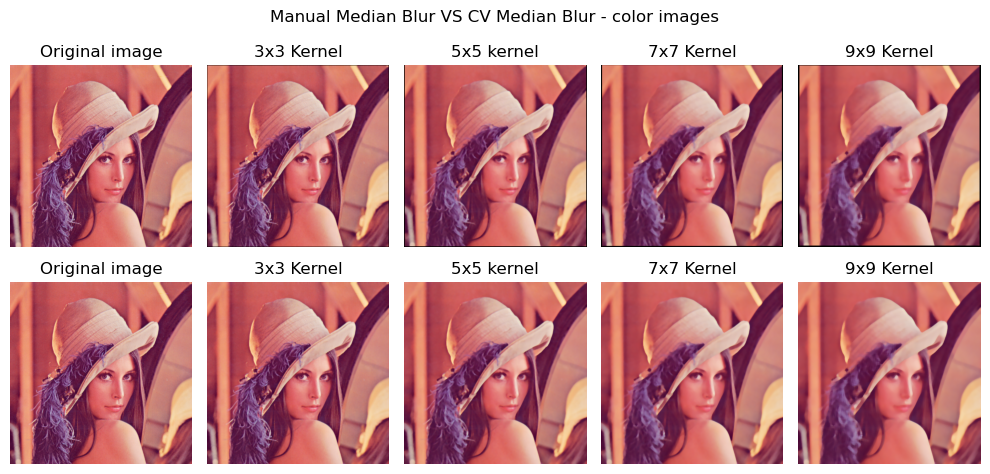

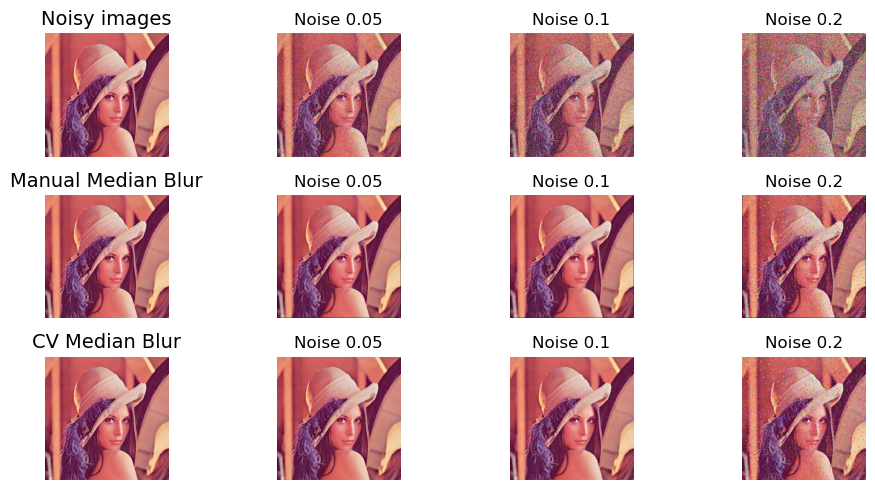

In [80]:
#MAIN
images = ["lenna.png"]
kernel_sizes = [3,5,7,9]
noises = [0.05,0.1,0.2] #noise probabilities

for image_name in images:
  image = cv2.cvtColor(cv2.imread(f"images/{image_name}",cv2.COLOR_BGR2RGB), cv2.COLOR_BGR2RGB) 
  if image is None:
    print("Image not found")
  else:
    # APPLY MEDIAN_BLUR TO IMAGE WITH DIFFERENT KERNEL SIZES
    outputs_1 = [image] #manual median filter 
    outputs_2 = [image] #function median filter
    for i in range(len(kernel_sizes)):
      outputs_1.append(median_blur_color(image,kernel_sizes[i]))
      outputs_2.append(cv2.medianBlur(image, kernel_sizes[i]))
    # PRINT IMAGES
    output_titles = ["Original image","3x3 Kernel","5x5 kernel","7x7 Kernel","9x9 Kernel"]
    outputs = [outputs_1, outputs_2]
    visualize_2(outputs,output_titles,["Manual Median Blur VS CV Median Blur - color images"],0)

    # ADD NOISE + Analyze when image is not recoverable
    noisy_images = [image]
    outputs_1 = [image] #Manual median filter outputs
    outputs_2 = [image] #CV funtion median filter outputs
    for i in range(len(noises)):
      #Create noisy image
      noisy_image = image.copy()
      random = np.random.random(image.shape)
      noisy_image[random < noises[i]] = 0
      noisy_image[random > 1 -  noises[i]] = 255
      noisy_images.append(noisy_image)
      #Apply median filter
      outputs_1.append(median_blur_color(noisy_image,3))
      outputs_2.append(cv2.medianBlur(noisy_image, 3))
    # PRINT IMAGES
    outputs = [noisy_images, outputs_1, outputs_2]
    output_titles = ["Original image","Noise 0.05","Noise 0.1","Noise 0.2"]
    row_titles = ["Noisy images","Manual Median Blur","CV Median Blur"]
    fig, axes = plt.subplots(len(outputs), len(outputs_1), figsize=(10, 5))
    for i in range(len(outputs)):
      for j in range(len(outputs_1)):
        axes[i,j].imshow(outputs[i][j], cmap='gray')
        axes[i,j].set_title(output_titles[j])
        axes[i,j].axis("off")
      axes[i, 0].set_title(row_titles[i], fontsize=14)
    plt.tight_layout()
    plt.show()

#### *3. Comparing median and mean blur filters*

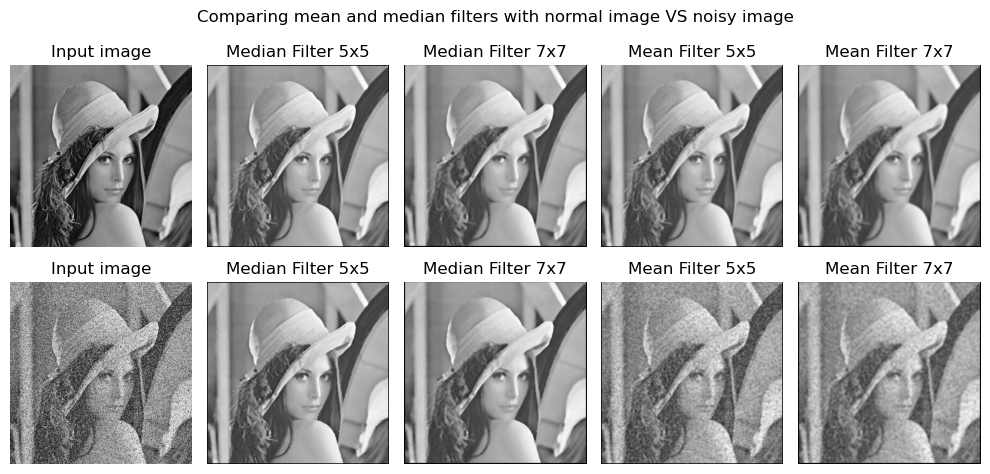

In [81]:
#MEAN VS MEDIAN FILTER COMPARISONS
def mean_blur(image, kernel_size):
    height, width = image.shape
    output_image = np.zeros_like(image)
    half_kernel = kernel_size // 2
    for i in range(half_kernel, height - half_kernel):
        for j in range(half_kernel, width - half_kernel):
            #Extract neighborhood
            neighborhood = image[i - half_kernel:i + half_kernel + 1, j - half_kernel:j + half_kernel + 1]
            #Apply mean filter
            output_image[i, j] = np.mean(neighborhood)
    return output_image

#MAIN
#COMPARE MEDIAN FILTER WITH GAUSSIAN AND BOX FILTERS
image = cv2.imread(f"images/lenna.png",cv2.IMREAD_GRAYSCALE)
noisy_image = image.copy()
random = np.random.random(image.shape)
noisy_image[random < 0.1] = 0
noisy_image[random > 1 -  0.1] = 255
#1. Apply to normal image 
output_median_5 = median_blur(image,5)
output_mean_5 = mean_blur(image, 5)
output_median_7 = median_blur(image,7)
output_mean_7 = mean_blur(image, 7)
outputs_1 = [image,output_median_5,output_median_7,output_mean_5,output_mean_7]
#2. Apply to noisy image
median_noisy_5 = median_blur(noisy_image,5)
mean_noisy_5 = mean_blur(noisy_image, 5)
median_noisy_7 = median_blur(noisy_image,7)
mean_noisy_7 = mean_blur(noisy_image,7)
outputs_2 = [noisy_image,median_noisy_5,median_noisy_7,mean_noisy_5,mean_noisy_7]
# PRINT IMAGES
output_titles = ["Input image","Median Filter 5x5","Median Filter 7x7","Mean Filter 5x5","Mean Filter 7x7"]
outputs = [outputs_1, outputs_2]
visualize_2(outputs, output_titles,["Comparing mean and median filters with normal image VS noisy image"],0)


## Morphological operators



#### Objective:
Implement the basic morphological operators seen in class and prove their properties.

Basic morphological operators:
 - Dilation
 - Erosion

Derived operations:   
 - Open
 - Close
 - Morphological gradient
 - Top hat (optional)
 - Bottom hat (optional)
 - Skeleton (optional)
 - Convex hull or perimeter (optional)

##### Prove each of the properties of dilation and erosion

- Translation Invariance (dilation and erosion)
- Anti-Extensive (Erosion)
- Extensive (Dilation)
- Idempotence (open and close)
- Monotonically increasing (dilation and erosion)

---

#### Guideline:
1. Implement a function to perform the erosion and dilation operations. DO NOT USE LIBRARY IMPLEMENTATIONS.
2. Implement the derived operations using the previous ones.
3. Apply different operators to dummy images and prove each of the properties of morphological operators.
4. Prove each one of the listed properties.

---

#### Expected results:
- Your hand-implemented functions for dilation, erosion, opening, closing & morphological gradient .
- Prove of each one of the properties (list them all). Prove it mathematically in the report or by examples (plot figures)
- Example of each operation on dummy images (design your owns using openCV)

#### *1. Implementing morphological operations*

In [4]:
"""
DILATION FUNCTION
"""   
def dilation(image, structuring_element, type):
    if type == "color":
        #Get the dimensions of the color image and structuring element
        image_height, image_width, num_channels = image.shape
        se_height, se_width = structuring_element.shape
        #Create an empty output image with the same dimensions as the input color image
        output_image = np.zeros((image_height, image_width, num_channels), dtype=np.uint8)
        #DILATION
        for y in range(image_height):
            for x in range(image_width):
                for channel in range(num_channels):
                    neighborhood_intensities = []
                    for i in range(se_height):
                        for j in range(se_width):
                            if structuring_element[i, j] == 1:
                                se_y = y - (se_height // 2) + i
                                se_x = x - (se_width // 2) + j
                                if 0 <= se_y < image_height and 0 <= se_x < image_width:
                                    neighborhood_intensities.append(image[se_y, se_x, channel])
                    output_image[y, x, channel] = max(neighborhood_intensities)
    else:
        #Get height and width of image and se
        height, width = image.shape
        s_height, s_width = structuring_element.shape
        # Create an empty output image
        output_image = np.zeros_like(image)
        #DILATION
        for y in range(height): #Iterate through every pixel
            for x in range(width):
                if type == "greyscale":
                    neighborhood_intensities = [] #store intensity values
                if type == "binary":
                    if image[y,x] == 0: #If pixel == 0, we don't do changes
                        continue
                for i in range(s_height): #Iterate through s.e
                    for j in range(s_width):
                        if structuring_element[i,j] == 1: #If pixel of s.e = 1
                            #Get coordinates of s.e pixel on binary image pixel
                            se_y = y - (s_height // 2) + i
                            se_x = x - (s_width // 2) + j
                            #Check if coordinates are within boundaries of binary image
                            if 0 <= se_y < height and 0 <= se_x < width:
                                if type == "binary":
                                    output_image[se_y,se_x] = 1
                                if type == "greyscale":
                                    neighborhood_intensities.append(image[se_y, se_x])
                if type == "greyscale":
                    output_image[y, x] = max(neighborhood_intensities)
    return output_image


"""
EROSION FUNCTION
"""
def erosion(image, structuring_element, type):
    if type == "color":
        #Get the dimensions of the color image and structuring element
        image_height, image_width, num_channels = image.shape
        se_height, se_width = structuring_element.shape
        #Create an empty output image with the same dimensions as the input color image
        output_image = np.zeros((image_height, image_width, num_channels), dtype=np.uint8)
        #EROSION
        for y in range(image_height):
            for x in range(image_width):
                for channel in range(num_channels):
                    neighborhood_intensities = []
                    for i in range(se_height):
                        for j in range(se_width):
                            if structuring_element[i, j] == 1:
                                se_y = y - (se_height // 2) + i
                                se_x = x - (se_width // 2) + j
                                if 0 <= se_y < image_height and 0 <= se_x < image_width:
                                    neighborhood_intensities.append(image[se_y, se_x, channel])
                    output_image[y, x, channel] = min(neighborhood_intensities)
    else:
        #Get height and width of image and se
        height, width = image.shape
        s_height, s_width = structuring_element.shape
        #Create an empty output image
        output_image = np.ones_like(image)
        #EROSION
        for y in range(height): #Iterate through each image pixel
            for x in range(width):
                if type == "greyscale":
                    neighborhood_intensities = []
                for i in range(s_height): #Iterate through s.e
                    for j in range(s_width):
                        if structuring_element[i, j] == 1:
                            #Get coordinates of s.e pixel on binary image pixel
                            se_y = y - (s_height // 2) + i
                            se_x = x - (s_width // 2) + j
                            #Check if coordinates are within the boundaries of the binary image
                            if 0 <= se_y < height and 0 <= se_x < width:
                                if type == "binary":
                                    if structuring_element[i, j] == 1 and image[se_y, se_x] == 0:
                                        output_image[y, x] = 0
                                if type == "greyscale":
                                    neighborhood_intensities.append(image[se_y, se_x])
                if type == "greyscale":
                    output_image[y, x] = min(neighborhood_intensities)

    return output_image

"""
DERIVED OPERATIONS
"""
def opening(image, structuring_element, type):
    output_image = erosion(image,structuring_element, type)
    output_image = dilation(output_image,structuring_element, type)
    return output_image

def closing(image, structuring_element, type):
    output_image = dilation(image,structuring_element, type)
    output_image = erosion(output_image,structuring_element, type)
    return output_image

def top_hat(image, structuring_element,type):
    return image - opening(image,structuring_element,type)

def bottom_hat(image, structuring_element,type):
    return closing(image,structuring_element,type) - image

def morphological_gradient(image, structuring_element, type):
    return dilation(image,structuring_element, type) - erosion(image,structuring_element, type)

basic_operations = [dilation,erosion,opening,closing,top_hat,bottom_hat,morphological_gradient]
basic_operations_1 = [dilation,erosion,opening,closing]
basic_operations_2 = [top_hat,bottom_hat,morphological_gradient]

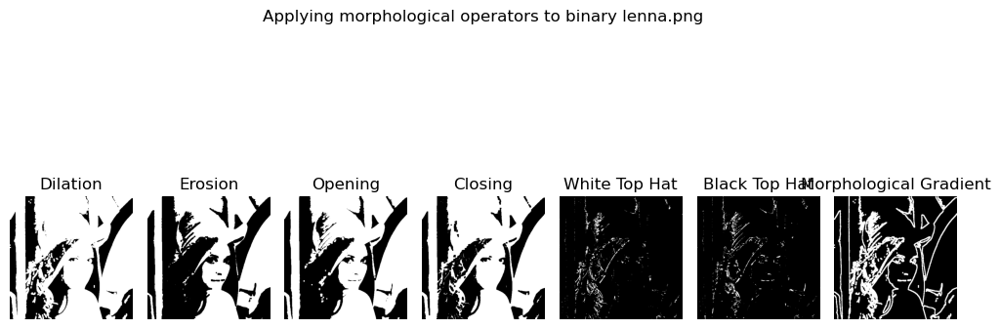

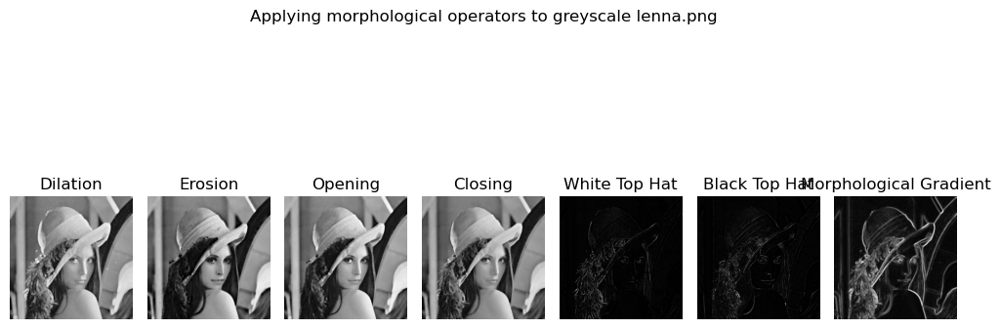

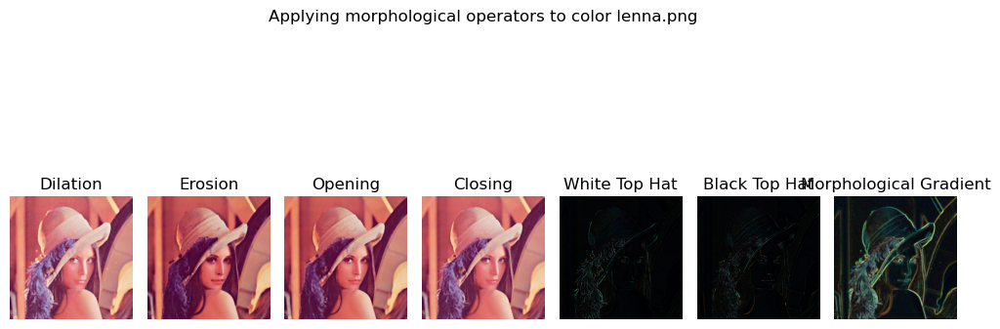

In [83]:
#1. APPLY OPERATORS TO IMAGES
images = ["lenna.png"]
s1 = np.ones((5, 5), np.uint8) #define 5x5 structuring element

for image_name in images:
    for type in ["binary","greyscale","color"]:
        if type == "binary":
            image = cv2.imread(f"images/{image_name}",cv2.IMREAD_GRAYSCALE)
            #Convert image to binary image
            _, threshold = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            image = np.where(image <= threshold, 1, 0)
        elif type == "greyscale":
            image = cv2.imread(f"images/{image_name}",cv2.IMREAD_GRAYSCALE)
        elif type == "color":
            image = cv2.cvtColor(cv2.imread(f"images/{image_name}",cv2.COLOR_BGR2RGB), cv2.COLOR_BGR2RGB) 
        outputs = [operation(image, s1, type) for operation in basic_operations]
        visualize(outputs,["Dilation","Erosion","Opening","Closing","White Top Hat","Black Top Hat",
                                "Morphological Gradient"],[f"Applying morphological operators to {type} {image_name}"],0)

#### *2. Optional: Convex Hull and Skeletonization*

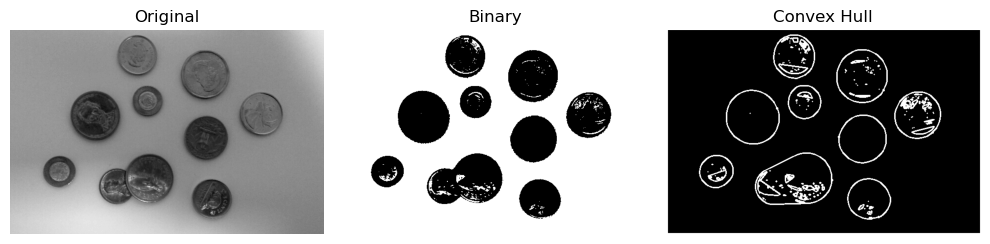

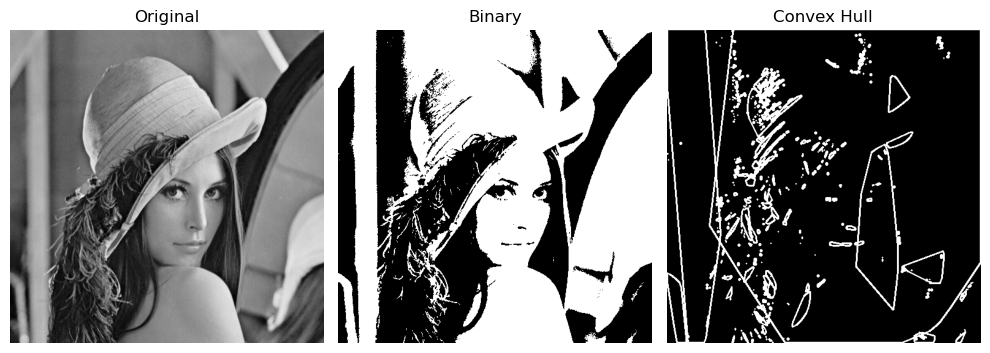

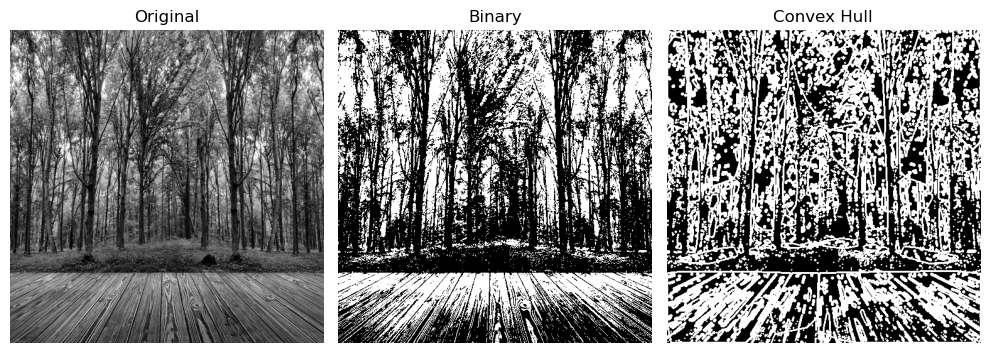

In [84]:
def convex_hull(image):
    # Convert image to binary
    _, threshold = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    binary_image = np.where(image <= threshold, 255,0).astype(np.uint8)
    #Find contours
    contours, _ = cv2.findContours(binary_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    #Create output image
    convex_hull_image = np.zeros_like(binary_image)
    
    for contour in contours:
        convex_hull = cv2.convexHull(contour)
        cv2.drawContours(convex_hull_image, [convex_hull], -1, (255, 0, 0), 2)

    return binary_image, convex_hull_image

for image_name in ["circles.jpg","lenna.png","bosque.jpg"]:
    image = cv2.imread(f"images/{image_name}",cv2.IMREAD_GRAYSCALE)
    binary_image,result = convex_hull(image)
    visualize([image,binary_image,result],["Original","Binary","Convex Hull"],None,None)

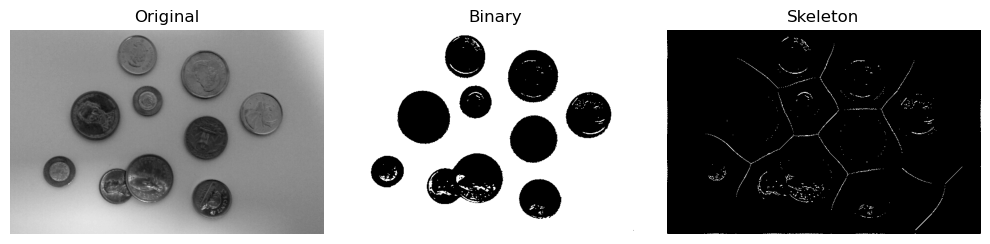

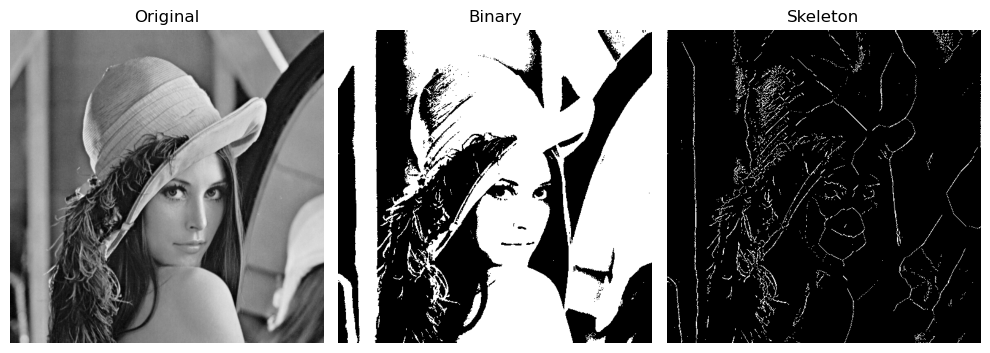

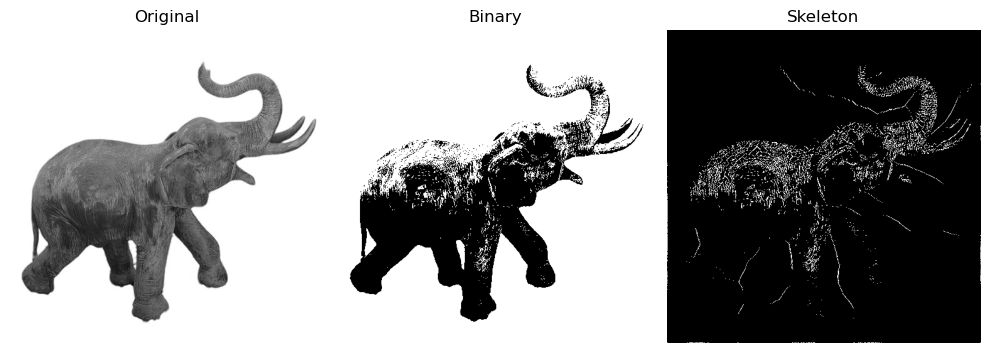

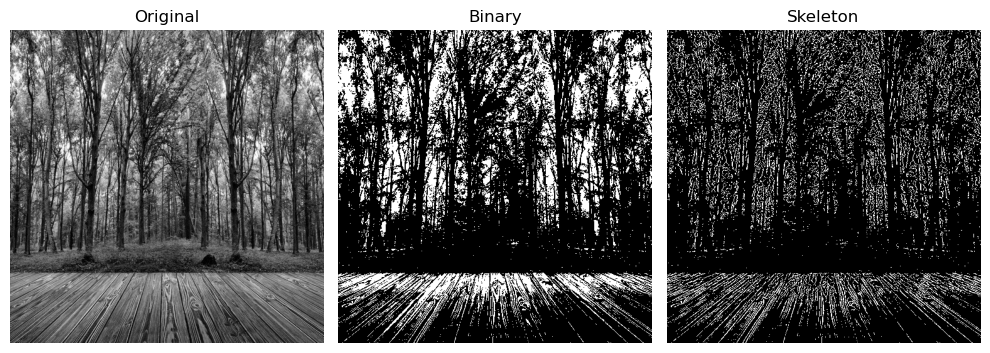

In [85]:
def skeletonize(image):
    #Transform to binary image
    _, image = cv2.threshold(image, 127, 255, 0)
    binary_image = image
    #Create an empty output image
    skeleton = np.zeros(image.shape, np.uint8)
    #Get a Kernel
    kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (3,3))
    #Repeat steps 1 to 3
    while True:
        #Open the image
        opened_image = cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)
        #Substract open from the original image
        substracted_image = cv2.subtract(image, opened_image)
        #Do erosion the original image
        eroded_image = cv2.erode(image, kernel)
        skeleton = cv2.bitwise_or(skeleton,substracted_image)
        image = eroded_image.copy()
        #If there are no white pixels left, the image has been completely eroded --> quit loop
        if cv2.countNonZero(image)==0:
            break
    return binary_image,skeleton

for image_name in ["circles.jpg","lenna.png","elefante.jpg","bosque.jpg"]:
    image = cv2.imread(f"images/{image_name}",cv2.IMREAD_GRAYSCALE)
    binary_image,skeleton = skeletonize(image)
    visualize([image,binary_image,skeleton],["Original","Binary","Skeleton"],None,None)

#### *2. Optional: Hit-or-miss*

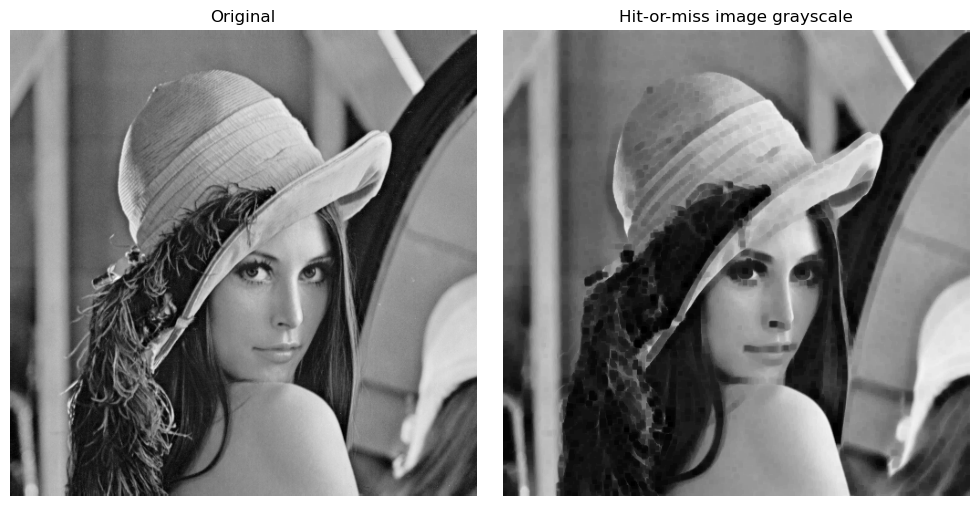

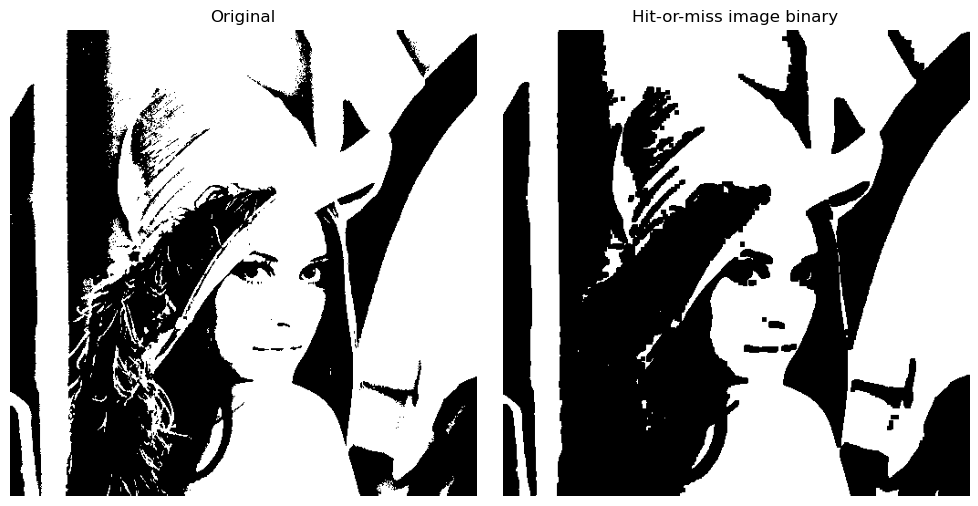

In [86]:
s1 = np.ones((5, 5), np.uint8) #define 5x5 structuring element
def hit_or_miss (image,s1):
    output_image = cv2.morphologyEx(image, cv2.MORPH_HITMISS,s1)
    return output_image
image = cv2.imread(f"images/lenna.png",cv2.IMREAD_GRAYSCALE)
hit_or_miss_image = hit_or_miss(image,s1)
visualize([image,hit_or_miss_image],["Original","Hit-or-miss image grayscale"],None,None)
#Convert image to binary image
_, threshold = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
image = np.where(image > threshold, 0, 255).astype(np.uint8)#for the morphologyEx the image needs to have 8 bits
hit_or_miss_image = hit_or_miss(image,s1)
visualize([image,hit_or_miss_image],["Original","Hit-or-miss image binary"],None,None)

#### *3. Proving properties*

In [53]:
image1 = cv2.imread(f"images/lenna.png",cv2.IMREAD_GRAYSCALE)
_, threshold = cv2.threshold(image1, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
image1 = np.where(image1 <= threshold,1,0)

s = np.ones((5, 5), np.uint8) #define 5x5 structuring element

type = "binary"

image2 = cv2.imread(f"images/lenna.png",cv2.IMREAD_GRAYSCALE)

In [54]:
#3.1 TRANSLATION INVARIANCE - BOTH (dilation and erosion)
#It means that it's the same translating and image and then aplaying erosion, than applying erosion and then translating
def translate_image_THEN_erosion(image,structuring_element,type):
    # Define the translation matrix
    M = np.float32([[1, 0, 25], [0, 1, 50]]) # Shift 25 pixels right and 50 pixels down
    #need transformation to apply the function
    image = image.astype('float32')
    translated_image = cv2.warpAffine(image, M, (image.shape[1], image.shape[0]))
    a = erosion(translated_image, structuring_element, type)
    return a
def erosion_THEN_translate_image(image,structuring_element,type):
    a = erosion(image, structuring_element, type)
    # Define the translation matrix
    M = np.float32([[1, 0, 25], [0, 1, 50]]) # Shift 25 pixels right and 50 pixels down
    #need transformation to apply the function
    a = a.astype('float32')
    translated_image = cv2.warpAffine(a, M, (image.shape[1], image.shape[0]))
    return translated_image
#It also happends the same for dilation
def translate_image_THEN_dilation(image,structuring_element,type):
    # Define the translation matrix
    M = np.float32([[1, 0, 25], [0, 1, 50]]) # Shift 25 pixels right and 50 pixels down
    #need transformation to apply the function
    image = image.astype('float32')
    translated_image = cv2.warpAffine(image, M, (image.shape[1], image.shape[0]))
    a = dilation(translated_image, structuring_element, type)
    return a
def dilation_THEN_translate_image(image,structuring_element,type):
    a = dilation(image, structuring_element, type)
    # Define the translation matrix
    M = np.float32([[1, 0, 25], [0, 1, 50]]) # Shift 25 pixels right and 50 pixels down
    #need transformation to apply the function
    a = a.astype('float32')
    translated_image = cv2.warpAffine(a, M, (image.shape[1], image.shape[0]))
    return translated_image

more_complex_operations1 = [translate_image_THEN_erosion, erosion_THEN_translate_image, translate_image_THEN_dilation,dilation_THEN_translate_image]

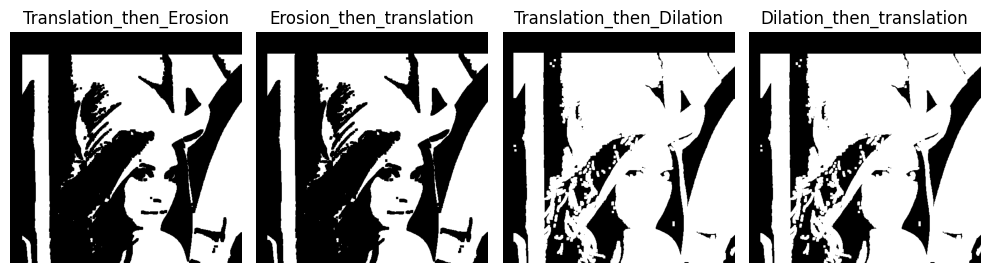

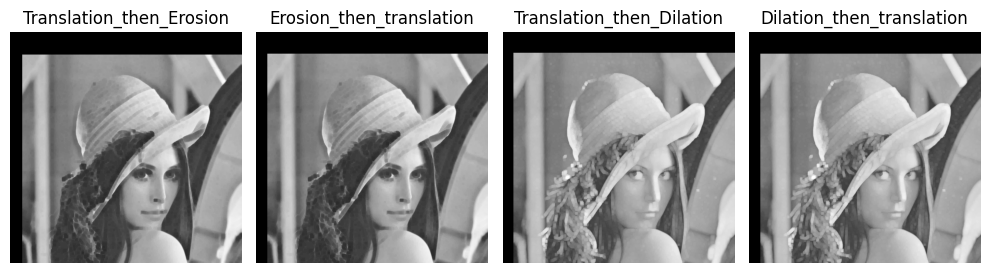

In [55]:
for image, type in [(image1,"binary"),(image2,"greyscale")]:    
    outputs = [operation(image, s, type) for operation in more_complex_operations1]
    output_titles = ["Translation_then_Erosion","Erosion_then_translation","Translation_then_Dilation","Dilation_then_translation"]
    visualize(outputs, output_titles,None,None)

In [56]:
#3.2 IDEMPOTENCE - BOTH (open and close)
#It means that by applying a multiple times opening or closing operation does not have any effect. Only the first time you iterate.
def idempotence_open(image,structuring_element,type):
    opened_1 = opening(image, structuring_element, type)
    opened_2 = opening(opened_1,structuring_element,type)
    return opened_1,opened_2
def idempotence_close(image,structuring_element,type):
    closed_1 = closing(image, structuring_element, type)
    closed_2 = closing(closed_1,structuring_element,type)
    return closed_1,closed_2

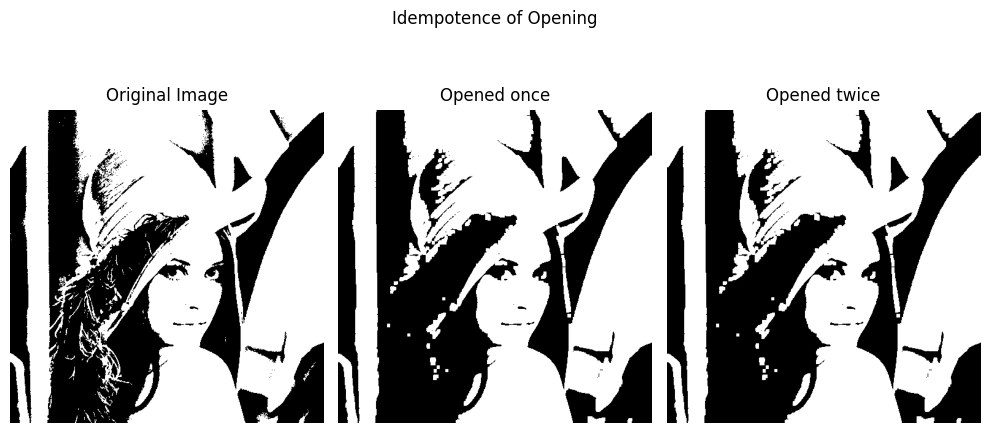

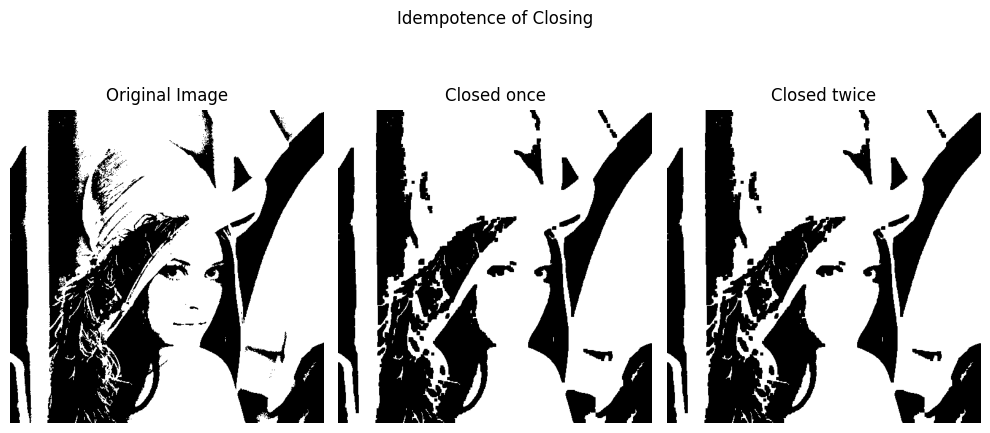

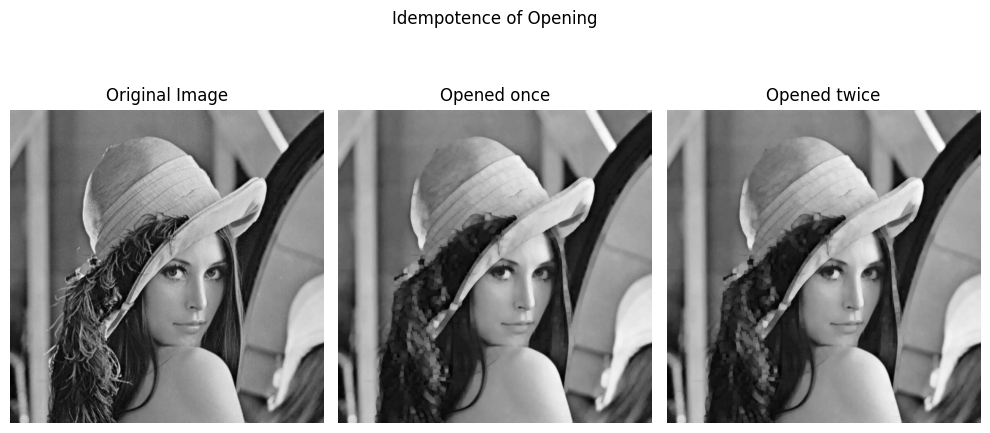

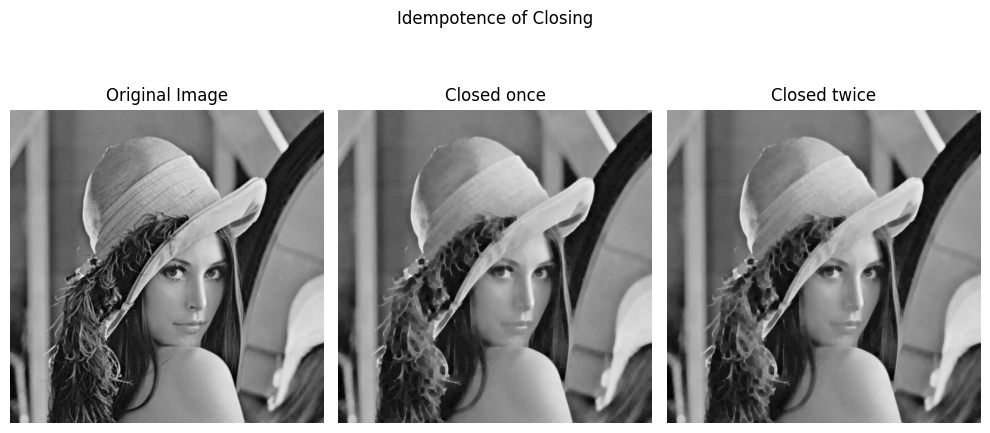

In [57]:
for image, type in [(image1,"binary"),(image2,"greyscale")]:   
    opened_1,opened_2 = idempotence_open(image,s,type)
    closed_1,closed_2 = idempotence_close(image,s,type)
    visualize([image,opened_1,opened_2],["Original Image","Opened once","Opened twice"],["Idempotence of Opening"],0)
    visualize([image,closed_1,closed_2],["Original Image","Closed once","Closed twice"],["Idempotence of Closing"],0)

In [58]:
#3.3 MONOTONICALLY INCREASING - BOTH (dilation and erosion)
#It means that we apply erosion or dilation once, and after we apply it again in the result. 
#At the end we will have the same or a further erosionated or dilated image, but it will not undo the previous action.
def monotonically_dilation(image,structuring_element,type):
    dilated_1 = dilation(image, structuring_element, type)
    dilated_2 = dilation(dilated_1,structuring_element,type)
    return dilated_1,dilated_2
def monotonically_erosion(image,structuring_element,type):
    eroded_1 = erosion(image, structuring_element, type)
    eroded_2 = erosion(eroded_1,structuring_element,type)
    return eroded_1,eroded_2

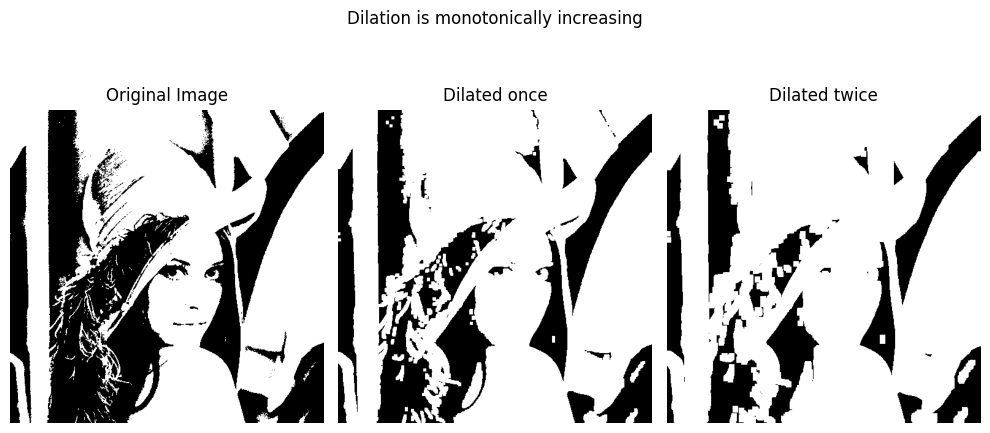

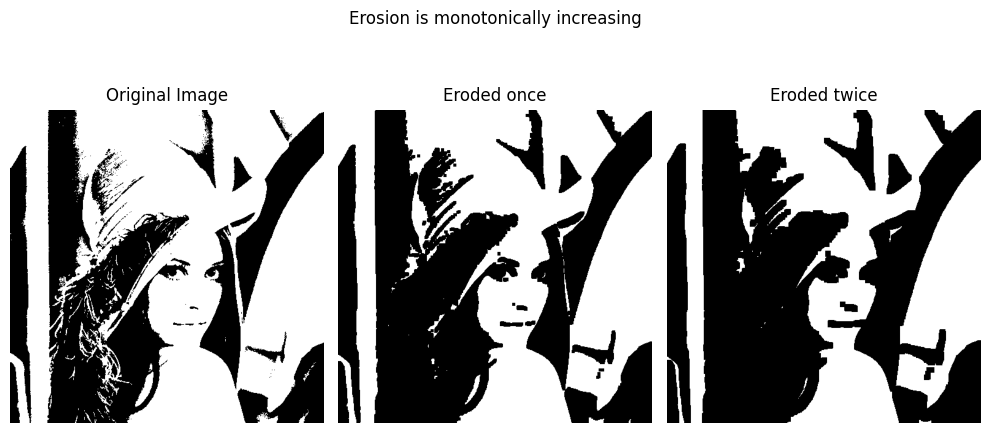

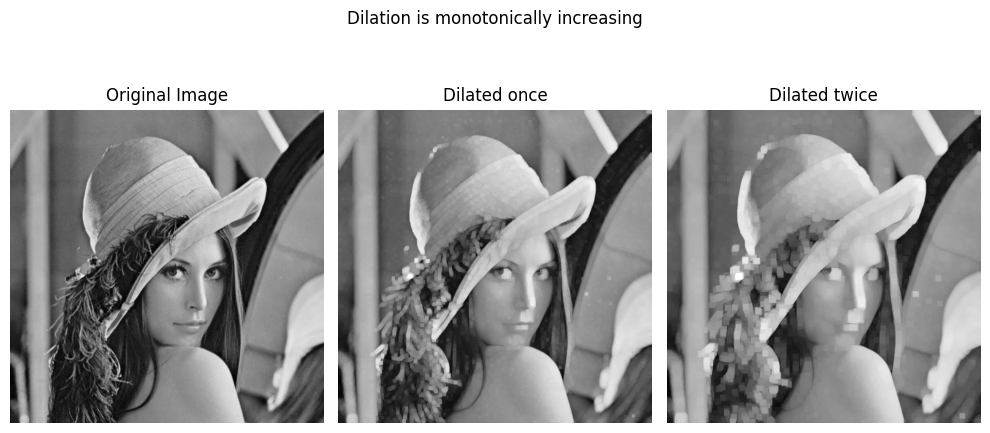

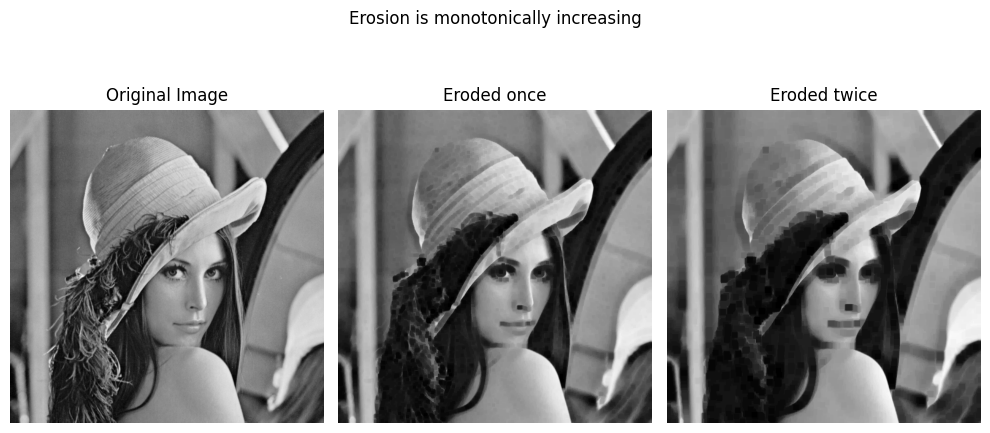

In [60]:
for image, type in [(image1,"binary"),(image2,"greyscale")]:   

    dilated_1,dilated_2 = monotonically_dilation(image,s,type)
    eroded_1,eroded_2 = monotonically_erosion(image,s,type)

    visualize([image,dilated_1,dilated_2],["Original Image","Dilated once","Dilated twice"],["Dilation is monotonically increasing"],0)
    visualize([image,eroded_1,eroded_2],["Original Image","Eroded once","Eroded twice"],["Erosion is monotonically increasing"],0)

In [61]:
#3.4.1 ANTI-EXTENSIVE - erosion 
#The eroded image is always a subset of the original image
def antiextensive_erosion(image,structuring_element,type):
    eroded = erosion(image, structuring_element, type)
    is_subset = np.all(np.logical_or(eroded == 0, image ==eroded))#return true or false
    is_subset = str(is_subset)
    return is_subset,eroded
#3.4.2 EXTENSIVE - dilation
#The original image is a subset of the dilated image
def extensive_dilation(image,structuring_element,type):
    dilated = dilation(image, structuring_element, type)
    is_subset = np.all(np.logical_or(image == 0, dilated==image))#return true or false
    is_subset = str(is_subset)
    return is_subset,dilated

Erosion is antiextensive: Eroded image is always a subset of the orginal image:  True
Erosion is antiextensive: Eroded image is always a subset of the orginal image:  True


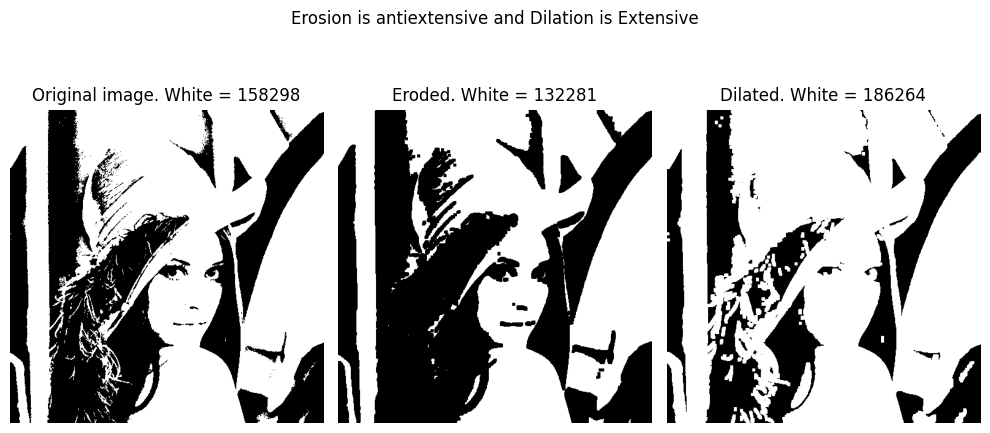

In [62]:
count = cv2.countNonZero(image1)

is_subset,eroded = antiextensive_erosion(image1,s,type)
print("Erosion is antiextensive: Eroded image is always a subset of the orginal image: ",is_subset)
count_eroded = cv2.countNonZero(eroded)

is_subset_2,dilated = extensive_dilation(image1,s,type)
print("Erosion is antiextensive: Eroded image is always a subset of the orginal image: ",is_subset)
count_dilated = cv2.countNonZero(dilated)

visualize([image1,eroded,dilated],[f"Original image. White = {count}",f"Eroded. White = {count_eroded}", f"Dilated. White = {count_dilated}"],
          ["Erosion is antiextensive and Dilation is Extensive"],0)

## Defect detection with Morphological operations


Objective:

Implement a pipeline for defect detection in a folder containing images. The pipelines should aim to obtain segmentation masks specifically on the defects using various image processing techniques seen in this course, focusing morphological operations.

---

Guideline:
- Inspect the images in the folder ```defects``` and identify the nature of defects.
- Design separate pipelines for different types of defects.
- For each pipeline, apply morphological operations and other techniques discussed in the course to isolate the defect and generate a segmentation mask.
- Evaluate the quality of the segmentation masks against ground truth using Intersection over Union (IoU) as a metric.

---

Expected results:
- Individual pipelines designed for each type of defect.
- Qualitative analysis showcasing the effectiveness of your pipeline in isolating defects.
- Quantitative analysis providing IoU scores for each pipeline when compared to ground truth masks in the same folder.

In [ ]:
#Function to evaluate segmentation masks with true masks
def evaluate(mask, gt):
  intersection = np.logical_and(mask, gt).sum()
  union = union = np.logical_or(mask, gt).sum()
  print("Intersection over Union (IoU):",intersection / union)

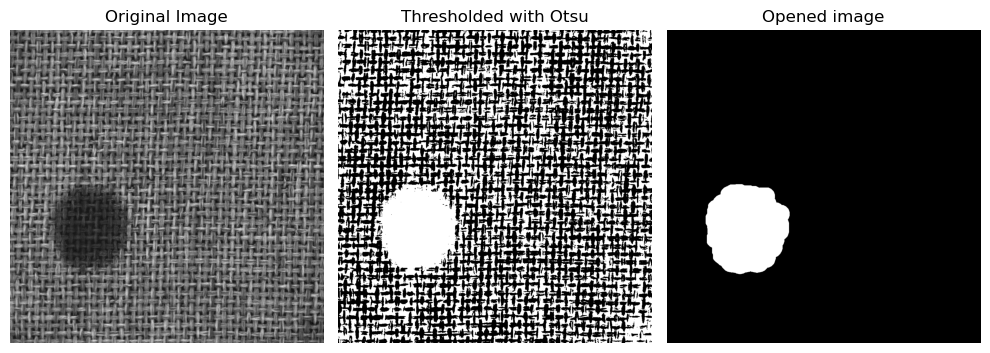

Intersection over Union (IoU): 0.9319751007862097


In [ ]:
"""
IMAGE 000
"""
def defect_circle(image):
  _, thresholded_image = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
  otsu_image = cv2.bitwise_not(thresholded_image) #Interchange foreground with background
  kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (30,30))
  opening_image = cv2.morphologyEx(otsu_image, cv2.MORPH_OPEN, kernel)
  opening_image = cv2.morphologyEx(opening_image, cv2.MORPH_DILATE, kernel,iterations =1)
  visualize([image,otsu_image,opening_image],["Original Image", "Thresholded with Otsu", "Opened image"], None,None)
  return opening_image

circle = cv2.imread("images/defect/000.png",cv2.IMREAD_GRAYSCALE)
circle_mask = defect_circle(circle)

#Evaluate quality of segmentation mask
true_mask = cv2.imread("images/defect/000_mask.png",cv2.IMREAD_GRAYSCALE)
evaluate(circle_mask,true_mask)


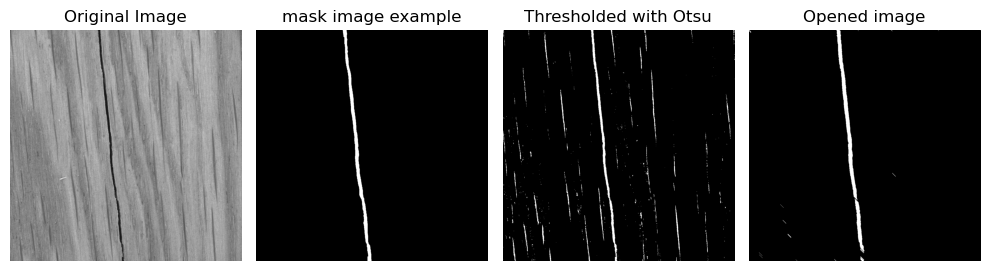

Intersection over Union (IoU): 0.7005509641873279


In [ ]:
"""
IMAGE 005 PIPELINE
"""
def defect_line(image,mask_image):
  thr = 92
  _, thresholded_image = cv2.threshold(image, thr, 255, cv2.THRESH_BINARY)
  otsu_image = cv2.bitwise_not(thresholded_image) # Interchange foreground with background
  kernel_size = 8
  kernel = np.eye(kernel_size, dtype=np.uint8)
  opening_image = cv2.morphologyEx(otsu_image, cv2.MORPH_ERODE, kernel)
  opening_image = cv2.morphologyEx(opening_image, cv2.MORPH_DILATE, kernel,iterations=2)
  visualize([image,mask_image,otsu_image,opening_image],["Original Image", "mask image example", "Thresholded with Otsu", "Opened image"], None,None)
  return opening_image

line = cv2.imread("images/defect/005.png",cv2.IMREAD_GRAYSCALE)
true_mask = cv2.imread("images/defect/005_mask.png",cv2.IMREAD_GRAYSCALE)
line_mask = defect_line(line,true_mask)
#Evaluate quality of segmentation mask
evaluate(line_mask,true_mask)


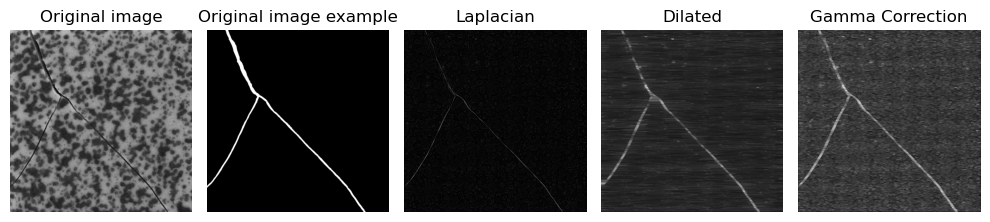

Intersection over Union (IoU): 0.020591185069224454


In [ ]:
"""
IMAGE 013 PIPELINE
"""

def gamma_correction(image, gamma=1.0):
    invGamma = 1.0/gamma
    table = np.array([(i / 255.0) ** invGamma * 255 for i in np.arange(0, 256)]).astype("uint8")
    return cv2.LUT(image, table)

def convolution(image, kernel):
    output_image = cv2.filter2D(image, -1, kernel, borderType=cv2.BORDER_CONSTANT)
    output_image = cv2.normalize(output_image, None, 0, 255, cv2.NORM_MINMAX)
    return output_image

kernel_Laplacian = np.array([[0,1,0],
                             [1,-4,1],
                             [0,1,0]])

def defect_marmol(image,true_mask):
    #Apply Laplacian 
    laplacian = convolution(image,kernel_Laplacian)
    #Apply morphological operations
    kernel = np.array([[1, 1, 1]], dtype=np.uint8)
    dilated = cv2.morphologyEx(laplacian, cv2.MORPH_DILATE, kernel,iterations=10)
    dilated = cv2.morphologyEx(dilated, cv2.MORPH_CLOSE, kernel,iterations=20)
    dilated = cv2.morphologyEx(dilated, cv2.MORPH_ERODE, kernel,iterations=5)
    adjusted = gamma_correction(laplacian,gamma=1.5)
    adjusted = cv2.morphologyEx(adjusted, cv2.MORPH_DILATE, kernel,iterations=5)
    #_, adjusted = cv2.threshold(adjusted, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    visualize([image,true_mask,laplacian,dilated,adjusted],["Original image","Original image example","Laplacian","Dilated","Gamma Correction"],None,None)
    return dilated

image013 = cv2.imread("images/defect/013.png",cv2.IMREAD_GRAYSCALE)
true_mask = cv2.imread("images/defect/013_mask.png",cv2.IMREAD_GRAYSCALE)
image013_mask = defect_marmol(image013,true_mask)
evaluate(image013_mask,true_mask)

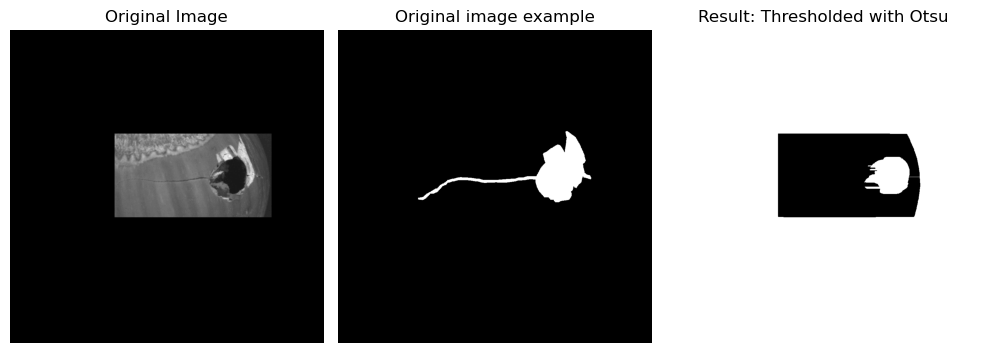

Intersection over Union (IoU): 0.014605737495760251


In [ ]:
"""
IMAGE 014 PIPELINE
"""
def defect_acorn(image,true_mask):
  h,w = image.shape
  image[:h//(10//3),:] = 1
  image[-2*h//5:,:] = 1
  image[:,:w//3] = 1
  image[:,-w//6:] = 1
    # Apply Gaussian blur to reduce noise
  blur = cv2.GaussianBlur(image,(5,5),0)
  
  # Use Otsu's thresholding
  ret3,otsu = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
  kernel = np.array([[1, 1, 1]], dtype=np.uint8)
  otsu = cv2.morphologyEx(otsu, cv2.MORPH_ERODE, kernel,iterations=6)
  otsu = cv2.morphologyEx(otsu, cv2.MORPH_OPEN, kernel,iterations=20)
  otsu = cv2.morphologyEx(otsu, cv2.MORPH_ERODE, kernel,iterations=15)
  otsu = cv2.bitwise_not(otsu) # Interchange foreground with background
  visualize([image,true_mask,otsu],["Original Image", "Original image example", "Result: Thresholded with Otsu"],None,None)

  return otsu

acorn = cv2.imread("images/defect/014.png", cv2.IMREAD_GRAYSCALE)
true_mask = cv2.imread("images/defect/014_mask.png",cv2.IMREAD_GRAYSCALE)
image014_mask = defect_acorn(acorn,true_mask)
evaluate(image014_mask,true_mask)

## Watermarking


#### Objective:
Use any of the previous techniques to apply a hard-to-removal watermark from to an image. After that you will try to reverse-engeneer your method and try to extract the text of the watermark you created.

---

#### Guideline:
1. Define a pipeline using the previous techniques (linear filtering, fourier transform, non-linear filtering, morphological operations, ...). You can use one or a combination of different techniques to produce a good pipeline.
2. Try to develop a method to extract the watermark (binary mask with the original watermark you introduced) by using the watermaked image and the original image.
3. Same as the previous one but relying only on the watermarked image. (You can't use the original image)
---

#### Expected results:
- A function that takes an image and a watermark (a binary image or a text) and returns the watermarked image.
- A pair of original image and the watermaked one
- A pair of a watermarked image and the watermark extracted (by using both original and watermaked image)
- A pair of a watermarked image and the watermark extracted (by using only the watermaked image)

#### *1. Applying watermarks to image*

In [10]:
def apply_watermark(image, watermark_image, watermark_text, position, font_scale, font_thickness,type):
  output_image = image.copy()
  alpha=0.5
  #Apply binary watermark image
  if watermark_image is not None:
    #Resize the watermark image to fit within the input image
    if type == "greyscale":
      height, width = output_image.shape
    elif type == "color":
      height, width, _ = output_image.shape
    watermark_image = cv2.resize(watermark_image, (width, height))
    #Blend the watermark image with the input image using alpha blending
    cv2.addWeighted(watermark_image, alpha, output_image, 1 - alpha, 0, output_image)
  #Apply a text watermark
  elif watermark_text is not None:
    #Parameters
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_color = (255,255,255)  #White color
    #Apply watermark
    cv2.putText(output_image, watermark_text, position, font, font_scale, font_color, font_thickness, cv2.LINE_AA)
  return output_image
       

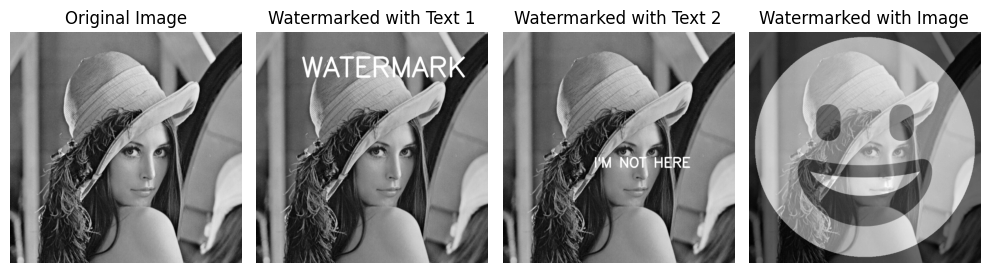

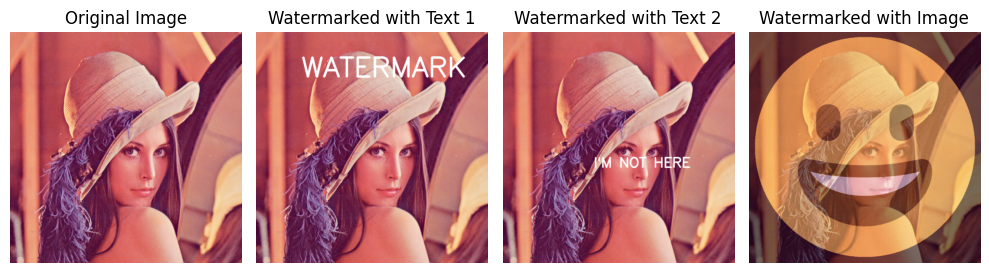

In [11]:
#1. APPLY WATERMARK
images = ["lenna.png"]

for image_name in images:
    image = cv2.imread(f"images/{image_name}",cv2.IMREAD_GRAYSCALE)
    image_color = cv2.cvtColor(cv2.imread(f"images/{image_name}",cv2.COLOR_BGR2RGB), cv2.COLOR_BGR2RGB)
    #Create watermarks
    watermark_image = cv2.imread("images/watermark.png",cv2.IMREAD_GRAYSCALE)
    watermark_image_color = cv2.cvtColor(cv2.imread("images/watermark.png",cv2.COLOR_BGR2RGB), cv2.COLOR_BGR2RGB)
    watermark_text = "WATERMARK"
    watermark_text2 = "I'M NOT HERE"
    #Apply watermarks to image greyscale
    for img, type, wmi in [(image,"greyscale",watermark_image),(image_color,"color",watermark_image_color)]:
        #TEXT 1 
        watermarked_text = apply_watermark(img,None,watermark_text,(100,100),2,4,type)
        if type == "greyscale":
            cv2.imwrite(f"images/watermarked/watermarked{type}.png",watermarked_text) #save image for later use
        else:
            cv2.imwrite(f"images/watermarked/watermarked{type}.png",cv2.cvtColor(watermarked_text, cv2.COLOR_RGB2BGR))
        #TEXT 2
        watermarked_text2 = apply_watermark(img,None,watermark_text2,(200,300),1,2,type)
        if type == "greyscale":
            cv2.imwrite(f"images/watermarked/watermarked2{type}.png",watermarked_text2) #save image for later use
        else:
            cv2.imwrite(f"images/watermarked/watermarked2{type}.png",cv2.cvtColor(watermarked_text2, cv2.COLOR_RGB2BGR))         

        #IMAGE
        watermarked_image = apply_watermark(img,wmi,None,None,None,None,type)
        #Visualize
        visualize([img,watermarked_text,watermarked_text2,watermarked_image],["Original Image","Watermarked with Text 1",
                                                                                "Watermarked with Text 2","Watermarked with Image"],None,None)



#### *2. Remove watermark (easy)*

In [12]:
def remove_watermark_easy(original_image, watermarked_image,type):
  #Ensure images have same dimensions
  if original_image.shape != watermarked_image.shape:
      raise ValueError("Input images must have the same dimensions.")
  #Get size of images
  height, width = original_image.shape[:2]
  #Create copy of watermarked_image
  output_image = watermarked_image.copy()
  #Look pixel by pixel and remove watermark
  for y in range(height):
        for x in range(width):
            if type == "greyscale":
                if watermarked_image[y, x] != original_image[y, x]:
                    output_image[y, x] = original_image[y, x]
            elif type == "color":
                #Check each color channel
                for c in range(3):
                    if watermarked_image[y, x, c] != original_image[y, x, c]:
                        output_image[y, x, c] = original_image[y, x, c]
  return output_image


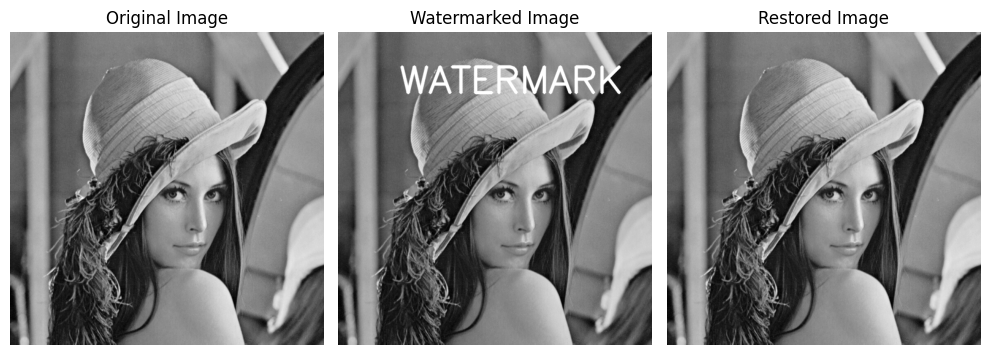

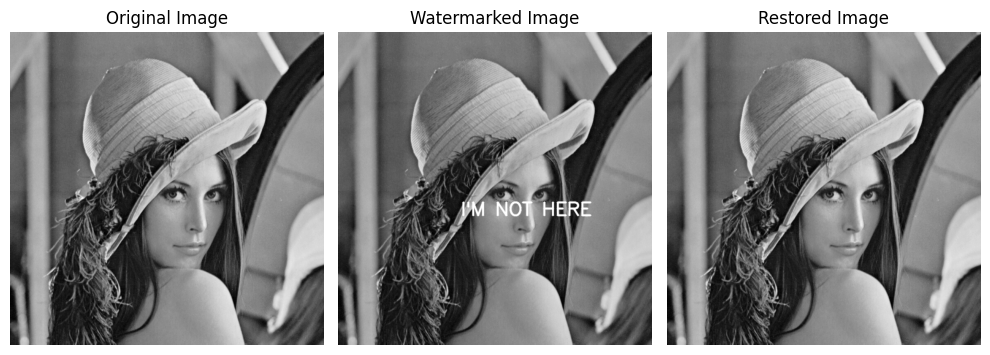

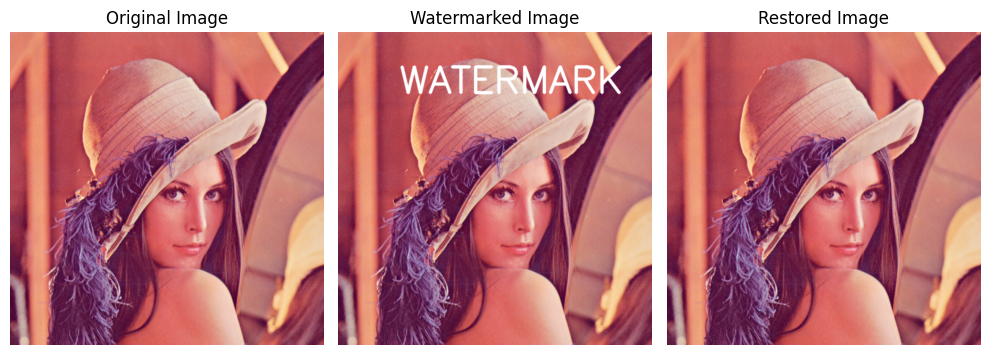

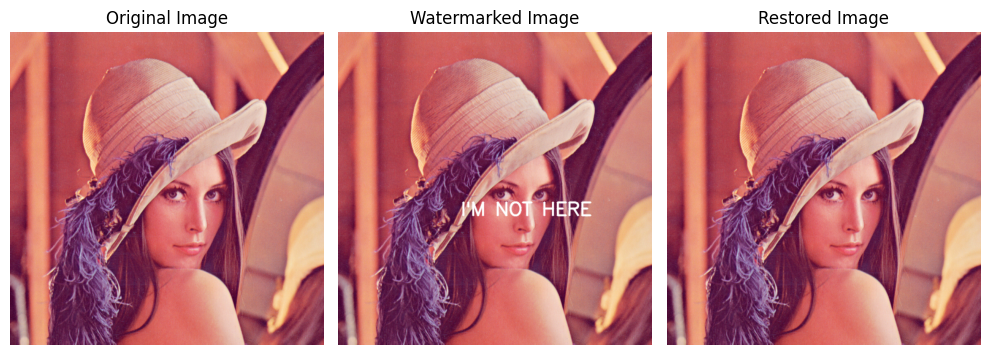

In [13]:
#2. EXTRACT WATERMARK USING ORIGINAL AND WATERMARKED IMAGE
wm_images_greyscale = ["watermarkedgreyscale.png","watermarked2greyscale.png"]
wm_images_color = ["watermarkedcolor.png","watermarked2color.png"]

for image_name in wm_images_greyscale:
    wm_restored_greyscale = [image]
    watermarked = cv2.imread(f"images/watermarked/{image_name}",cv2.IMREAD_GRAYSCALE)
    wm_restored_greyscale.append(watermarked)
    wm_restored_greyscale.append(remove_watermark_easy(image, watermarked,"greyscale"))
    visualize(wm_restored_greyscale,["Original Image","Watermarked Image","Restored Image"],None,None)

for image_name in wm_images_color:
    wm_restored_color = [image_color]
    watermarked = cv2.cvtColor(cv2.imread(f"images/watermarked/{image_name}",cv2.COLOR_BGR2RGB), cv2.COLOR_BGR2RGB)
    wm_restored_color.append(watermarked)
    wm_restored_color.append(remove_watermark_easy(image_color, watermarked,"color"))
    visualize(wm_restored_color,["Original Image","Watermarked Image","Restored Image"],None,None)


#### *3. Remove watermark (hard) only using watermarked image*

##### 3.1. First approaches that failed

In [14]:
#USING EROSION AND DILATION
def remove_watermark_hard_1(image):
    # Convert the input image to binary using a threshold (adjust the threshold as needed)
    _, binary_image = cv2.threshold(image, 200, 255, cv2.THRESH_BINARY)
    # Define a kernel for morphological operations (you can adjust the kernel size)
    kernel = np.ones((5, 5), np.uint8)
    # Perform erosion followed by dilation to remove small text components
    eroded_image = cv2.erode(binary_image, kernel, iterations=1)
    dilated_image = cv2.dilate(eroded_image, kernel, iterations=1)
    # Invert the binary image to keep the non-text areas
    inverted_image = 255 - dilated_image
    # Apply the inverted binary mask to the original grayscale image
    result_image = cv2.bitwise_and(image, image, mask=inverted_image)
    return result_image

#USING PYTESSERACT - Do not execute if program is not installed
pytesseract.pytesseract.tesseract_cmd = r"C:/Program Files/Tesseract-OCR/tesseract.exe"
def remove_watermark_hard_2(watermarked_image):
    image = watermarked_image.copy()
    #Convert the image to binary
    binary = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    #Invert the image
    binary = cv2.bitwise_not(binary)
    #Detect the text in the image
    text = pytesseract.image_to_string(Image.fromarray(binary))
    #Get the bounding box coordinates of the text
    d = pytesseract.image_to_data(Image.fromarray(binary), output_type=pytesseract.Output.DICT)
    n_boxes = len(d['level'])
    for i in range(n_boxes):
        (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
        cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
    #Remove the text by painting over it
    for i in range(n_boxes):
        if int(d['conf'][i]) > 60:
            (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
            cv2.rectangle(image, (x, y), (x + w, y + h), (255, 255, 255), -1)
    #Save the result
    return image


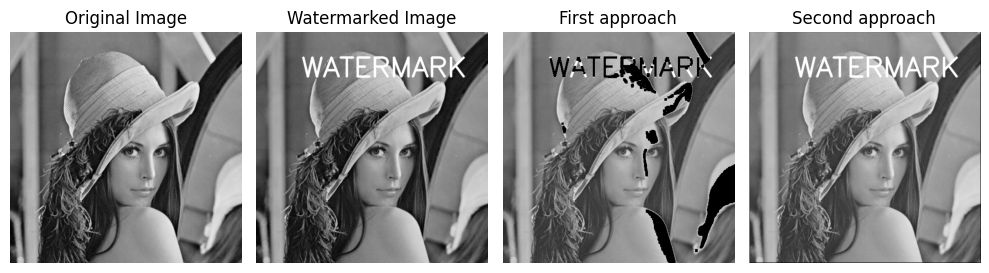

In [15]:
#3. EXTRACT WATERMARK USING ONLY WATERMARKED IMAGE - FIRST APPROACHES
watermarked = cv2.imread("images/watermarked/watermarkedgreyscale.png",cv2.IMREAD_GRAYSCALE)

restored_image_1 = remove_watermark_hard_1(watermarked)
restored_image_2 = remove_watermark_hard_2(watermarked)
visualize([image,watermarked,restored_image_1,restored_image_2],["Original Image","Watermarked Image",
                                                                      "First approach","Second approach"],None,None)


##### 3.2. Second approach: using Keras-OCR
For this method to work correctly, some python libraries need to be installed.

In [ ]:
%pip install keras-ocr
%pip install tensorflow

Looking for C:\Users\sara0\.keras-ocr\craft_mlt_25k.h5
Instructions for updating:
Use `tf.image.resize(...method=ResizeMethod.BILINEAR...)` instead.
Looking for C:\Users\sara0\.keras-ocr\crnn_kurapan.h5
1/1 [==============================] - 0s 200ms/step


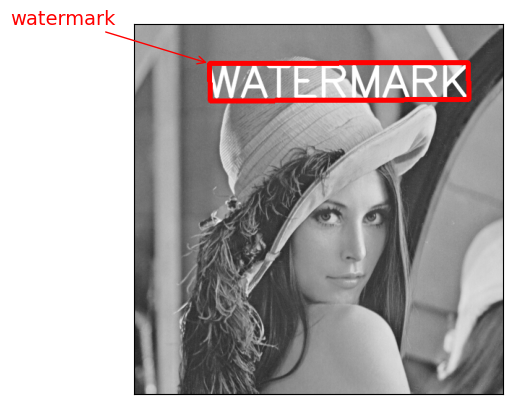

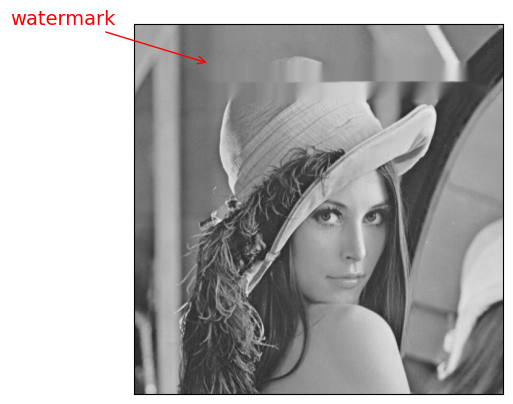

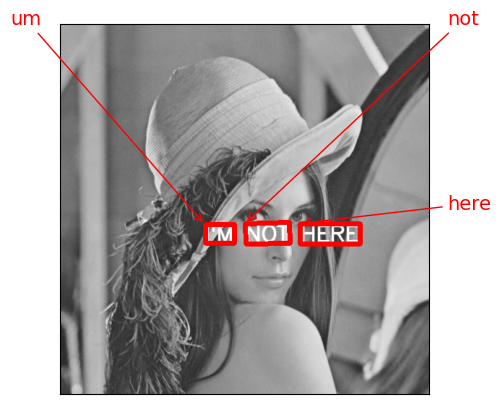

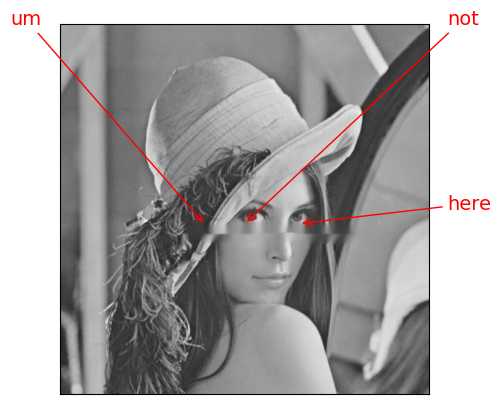

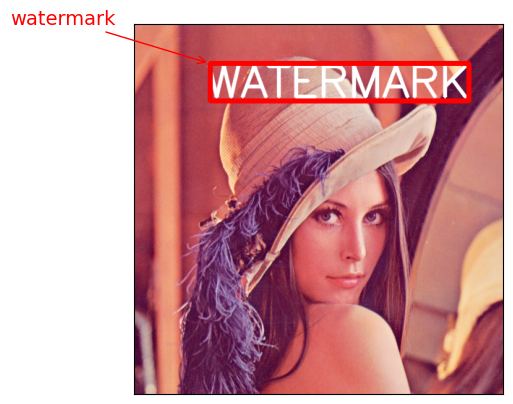

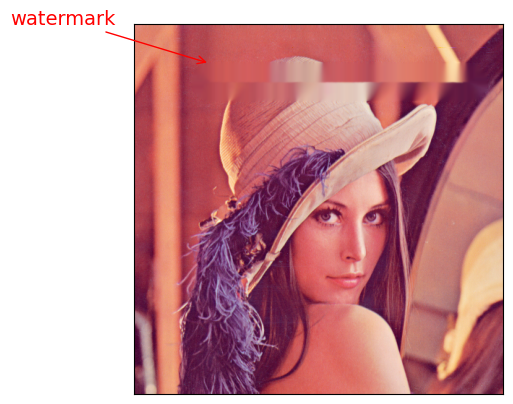

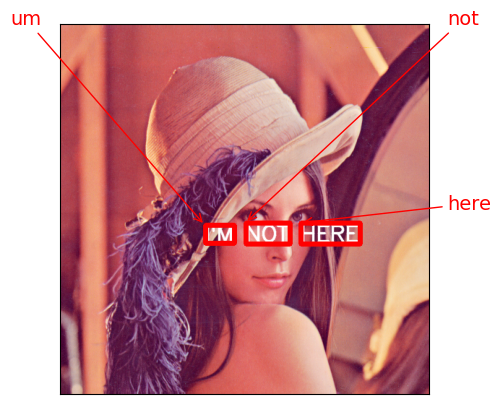

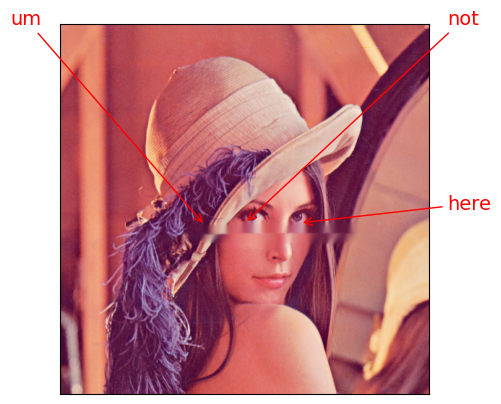

In [17]:
#3. EXTRACT WATERMARK USING ONLY WATERMARKED IMAGE - USING KERAS-OCR
import keras_ocr
import math

def midpoint(x1, y1, x2, y2):
    x_mid = int((x1 + x2)/2)
    y_mid = int((y1 + y2)/2)
    return (x_mid, y_mid)

pipeline = keras_ocr.pipeline.Pipeline()

def boxes(image_path, pipeline):
    #Read image
    img = keras_ocr.tools.read(image_path)
    #Prediction_groups is a list of (word, box) tuples
    prediction_groups = pipeline.recognize([img])
    #Print image with annotation and boxes
    keras_ocr.tools.drawAnnotations(image=img, predictions=prediction_groups[0])

def inpaint_text(img_path, pipeline):
    #Read image
    img = keras_ocr.tools.read(img_path)
    #Generate (word, box) tuples 
    prediction_groups = pipeline.recognize([img])
    #Print image with annotation and boxes
    keras_ocr.tools.drawAnnotations(image=img, predictions=prediction_groups[0])
    
    #Create mask
    mask = np.zeros(img.shape[:2], dtype="uint8")

    for box in prediction_groups[0]:
        x0, y0 = box[1][0]
        x1, y1 = box[1][1] 
        x2, y2 = box[1][2]
        x3, y3 = box[1][3] 
        
        x_mid0, y_mid0 = midpoint(x1, y1, x2, y2)
        x_mid1, y_mi1 = midpoint(x0, y0, x3, y3)
        
        thickness = int(math.sqrt( (x2 - x1)**2 + (y2 - y1)**2 ))
        
        cv2.line(mask, (x_mid0, y_mid0), (x_mid1, y_mi1), 255, thickness)

        #Inpaint image
        img = cv2.inpaint(img, mask, 7, cv2.INPAINT_NS)

    return img

paths = ["watermarkedgreyscale.png","watermarked2greyscale.png","watermarkedcolor.png","watermarked2color.png"]

for path in paths: 
    boxes(f"images/watermarked/{path}",pipeline)
    result = inpaint_text(f"images/watermarked/{path}",pipeline)
    plt.imshow(result)


## Watermark extraction challenge


#### Objective:
Create a binary mask where you can read the text of the watermark hidden on images on folder ```lab2_challenge```.  
Remember that this challenge counts as extra part of the lab and do not count of the optional points of this lab, so there's no guideline. Instead there's a hint on each level you can use to start designing your own method.


---

#### Hints:
  - Hints for each image:
    - Easy: Will edges and some post-processing be enough?
    - Medium: Equalizing the image correclty could make watermark more visible
    - Hard: Do you think image looks wierd enough to check fourier spece?

---

#### Expected results:
- A binary image with the extracted text (or at least somewhat readable) and the string of text you extracted on each one.

1/1 [==============================] - 7s 7s/step


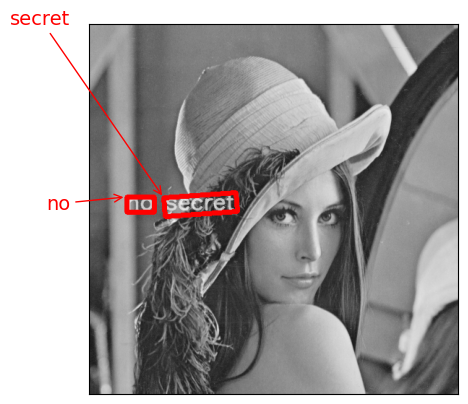

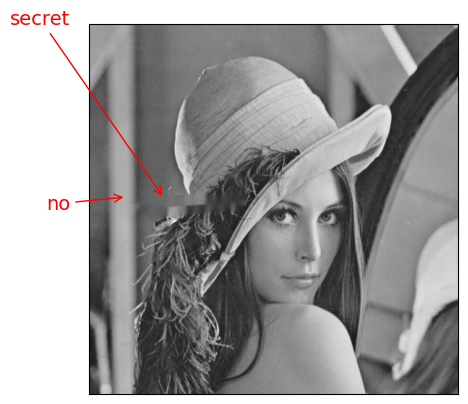

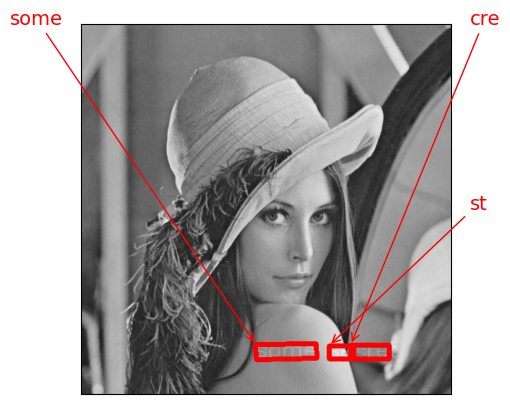

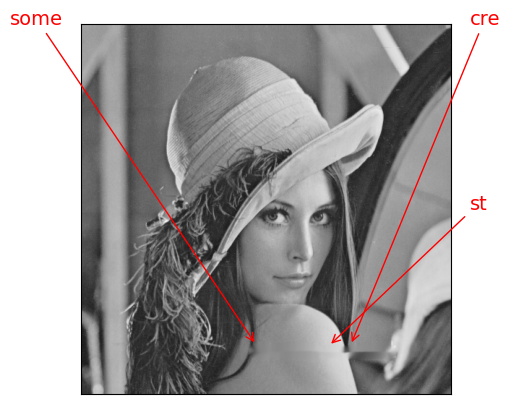

In [18]:
paths = ["watermark_easy.png","watermark_medium.png"]

for path in paths: 
    boxes(f"images/challenge/{path}",pipeline)
    result = inpaint_text(f"images/challenge/{path}",pipeline)
    plt.imshow(result)

Watermark: YOU HAVE LOST THE GAME


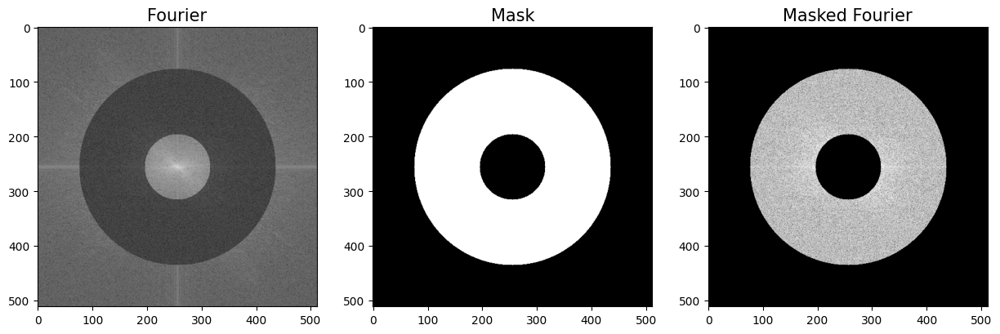

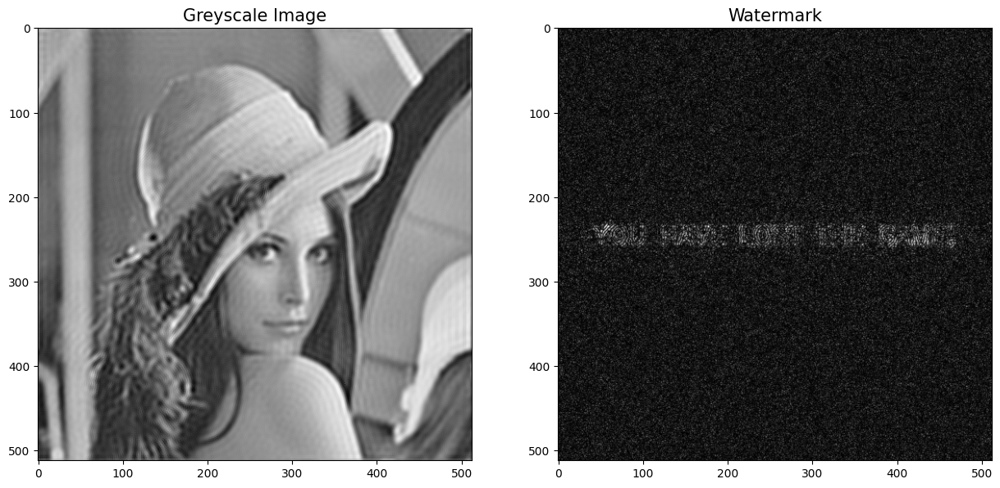

In [19]:
#Image hard with Fourier
from scipy.fftpack import fft2, ifft2, fftshift, ifftshift

def Fourier(image):
    #Apply Fourier Transform to the image (transform image from spatial to frequency domain)
    fourier = np.fft.fft2(image) #Applies 2D FFT to greyscale image
    fourier = np.fft.fftshift(fourier) #Shifts 0-frequency component to middle                    
    #Get magnitude spectrum
    frequency_magnitudes = np.log(abs(fourier))

    # Create a donut mask
    rows, cols = fourier.shape
    center_row, center_col = rows // 2, cols // 2
    radius_inner = 60  #Inner radius of the donut
    radius_outer = 180  #Outer radius of the donut
    #Create a meshgrid of the same size as the Fourier spectrum
    r, c = np.mgrid[:rows, :cols]
    #Create a circular mask
    # Corrected mask creation
    mask = np.logical_and(np.sqrt((r - center_row)**2 + (c - center_col)**2) > radius_inner,
                            np.sqrt((r - center_row)**2 + (c - center_col)**2) <= radius_outer).astype(float)

    # Apply the mask to the Fourier spectrum
    fourier[mask==0] = 1

    #Visualization
    fig, ax = plt.subplots(1,3,figsize=(15,15))
    ax[0].imshow(frequency_magnitudes,cmap="gray")
    ax[0].set_title("Fourier", fontsize = 15)
    ax[1].imshow(mask,cmap="gray")
    ax[1].set_title("Mask", fontsize = 15)
    ax[2].imshow(np.log(np.abs(fourier)), cmap='gray')
    ax[2].set_title('Masked Fourier', fontsize = 15)

    fig, ax = plt.subplots(1,2,figsize=(15,15))
    ax[0].imshow(image, cmap = 'gray')
    ax[0].set_title('Greyscale Image', fontsize = 15)
    ax[1].imshow(abs(np.fft.ifft2(fourier)), cmap='gray')
    ax[1].set_title('Watermark', fontsize = 15)


#MAIN
image = cv2.imread(f"images/challenge/watermark_hard.png",cv2.IMREAD_GRAYSCALE)
if image is None:
    print("Image not found")
else:
    Fourier(image)
    print("Watermark: YOU HAVE LOST THE GAME")


